## Introducción para el notebook: EDA_mapa_conectividad.ipynb

### Contexto General
Los datos analizados en este notebook provienen del **Ente Nacional de Comunicaciones (ENACOM)** de Argentina, el organismo regulador de las telecomunicaciones en el país. Esta información permite evaluar el estado y la evolución del acceso a internet en Argentina.

### Descripción del Conjunto de Datos
Este análisis se centra en la hoja de datos **"Mapa de conectividad"**, que proporciona información detallada sobre la distribución geográfica del acceso a internet en distintas regiones del país. Los datos incluyen información sobre infraestructura, disponibilidad del servicio y penetración del acceso en diferentes áreas.

### Objetivo del Análisis
El propósito de este análisis es **examinar la conectividad en el territorio argentino**, identificando patrones espaciales en la disponibilidad del servicio de internet. Se analizarán brechas digitales entre regiones urbanas y rurales, así como posibles factores que influyen en la accesibilidad a la conectividad.


Carga y Exploración Inicial de los Datos

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  # Corregido
import seaborn as sns

In [32]:
import pandas as pd
import sweetviz as sv
from skimpy import skim

# Reemplaza el nombre del archivo con el que quieres evaluar y modificar
nombre_archivo = "mapa_conectividad.csv"

# Ruta completa al archivo
ruta_completa = r"C:\Users\USUARIO\OneDrive - Secretaria de Educacion del Distrito\Escritorio\SOYhENRY\PI_21\PI_2_DA_corregido\data_internet_ind" + "\\" + nombre_archivo

# Cargar el archivo CSV
df = pd.read_csv(ruta_completa)



In [33]:
import sweetviz as sv
from skimpy import skim

In [34]:
# Verificar la carga
print(df.info())
print(df.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4305 entries, 0 to 4304
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Provincia       4305 non-null   object 
 1   Partido         4305 non-null   object 
 2   Localidad       4305 non-null   object 
 3   Población       4305 non-null   int64  
 4   ADSL            4305 non-null   object 
 5   Cablemódem      4305 non-null   object 
 6   Dial Up         4305 non-null   object 
 7   Fibra óptica    4305 non-null   object 
 8   Satelital       4305 non-null   object 
 9   Wireless        4305 non-null   object 
 10  Telefonía Fija  4305 non-null   object 
 11  3G              4305 non-null   object 
 12  4G              4305 non-null   object 
 13  Link            4293 non-null   float64
 14  Latitud         4305 non-null   float64
 15  Longitud        4305 non-null   float64
dtypes: float64(3), int64(1), object(12)
memory usage: 538.3+ KB
None
      Provinc

In [35]:
# Mostrar primeras filas del DataFrame
print("\nInformación del DataFrame:")
df.head()


Información del DataFrame:


,Provincia,Partido,Localidad,Población,ADSL,Cablemódem,Dial Up,Fibra óptica,Satelital,Wireless,Telefonía Fija,3G,4G,Link,Latitud,Longitud
0,BUENOS AIRES,25 de Mayo,25 de Mayo,23408,SI,SI,--,--,SI,SI,SI,SI,SI,6854100.0,-35.433939,-60.173121
1,BUENOS AIRES,25 de Mayo,Agustín Mosconi,280,--,--,--,--,--,--,SI,--,--,6854010.0,-35.739217,-60.559063
2,BUENOS AIRES,25 de Mayo,Del Valle,899,SI,--,--,--,SI,--,--,SI,--,6854020.0,-35.897345,-60.731609
3,BUENOS AIRES,25 de Mayo,Ernestina,145,SI,--,--,--,--,--,SI,--,--,6854030.0,-35.270234,-59.557503
4,BUENOS AIRES,25 de Mayo,Gobernador Ugarte,547,--,--,--,--,--,SI,--,--,--,6854040.0,-35.164397,-60.081358


In [36]:
# Mostrar información del DataFrame
print("\nInformación del DataFrame:")
df.info()


Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4305 entries, 0 to 4304
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Provincia       4305 non-null   object 
 1   Partido         4305 non-null   object 
 2   Localidad       4305 non-null   object 
 3   Población       4305 non-null   int64  
 4   ADSL            4305 non-null   object 
 5   Cablemódem      4305 non-null   object 
 6   Dial Up         4305 non-null   object 
 7   Fibra óptica    4305 non-null   object 
 8   Satelital       4305 non-null   object 
 9   Wireless        4305 non-null   object 
 10  Telefonía Fija  4305 non-null   object 
 11  3G              4305 non-null   object 
 12  4G              4305 non-null   object 
 13  Link            4293 non-null   float64
 14  Latitud         4305 non-null   float64
 15  Longitud        4305 non-null   float64
dtypes: float64(3), int64(1), object(12)
memory usage: 

In [37]:
# Mostrar las últimas filas del DataFrame
print("\nÚltimas filas del DataFrame:")
print(df.tail())



Últimas filas del DataFrame:
     Provincia      Partido                        Localidad  Población ADSL  \
4300  SANTA FE    San Justo            Silva (Est. Abipones)        360   --   
4301  SANTA FE    San Justo  Vera y Pintado (Est. Guaraníes)        997   SI   
4302  SANTA FE    San Justo                           Videla       2027   SI   
4303  SANTA FE  San Lorenzo                            Aldao        587   --   
4304  SANTA FE  San Lorenzo                 Capitán Bermúdez      29218   SI   

     Cablemódem Dial Up Fibra óptica Satelital Wireless Telefonía Fija  3G  \
4300         --      --           --        --       SI             --  --   
4301         SI      --           SI        --       SI             SI  --   
4302         --      --           SI        --       SI             SI  --   
4303         SI      --           --        --       --             SI  --   
4304         SI      --           SI        --       --             SI  SI   

      4G        Link

In [38]:
from skimpy import skim

# Resumen del DataFrame
skim(df)


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 4305   │ │ string      │ 12    │                                                          │
│ │ Number of columns │ 16     │ │ float64     │ 3     │                                                          │
│ └───────────────────┴────────┘ │ int64       │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━┳━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column   ┃ NA ┃ NA %     ┃ mean     ┃ sd      ┃ p0      ┃ p25      ┃ p50     ┃ p75      ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━╇━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ Població │  0 │        0 │     8707 │   38240 │       0 │      117 │     579 │     3217 │ 1317000 │   ▇    │  │
│ │ n        │    │          │          │         │         │          │         │          │         │        │  │
│ │ Link     │ 12 │ 0.278745 │ 39090000 │ 2940000 │ 2000000 │ 10090000 │ 3401000 │ 66130000 │ 9401000 │ ▇▂▂▃▂▃ │  │
│ │          │    │ 64459930 │          │       0 │         │          │       0 │          │       0 │        │  │
│ │          │    │       31 │          │         │         │          │         │          │         │        │  │
│ │ Latitud  │  0 │        0 │   -32.26 │   5.002 │  -77.87 │   -34.71 │  -32.29 │   -28.58 │  -21.82 │    ▁▇▅ │  │
│ │ Longitud │  0 │        0 │   -63.04 │    3.83 │  -72.89 │   -65.69 │  -63.45 │   -60.01 │  -34.63 │  ▃▇▃   │  │
│ └──────────┴────┴──────────┴──────────┴─────────┴─────────┴──────────┴─────────┴──────────┴─────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┓  │
│ ┃           ┃    ┃      ┃          ┃           ┃           ┃           ┃ chars per  ┃ words per ┃ total      ┃  │
│ ┃ column    ┃ NA ┃ NA % ┃ shortest ┃ longest   ┃ min       ┃ max       ┃ row        ┃ row       ┃ words      ┃  │
│ ┡━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━┩  │
│ │ Provincia │  0 │    0 │ CABA     │ SANTIAGO  │ BUENOS    │ TUCUMAN   │       8.91 │       1.6 │       6854 │  │
│ │           │    │      │          │ DEL       │ AIRES     │           │            │           │            │  │
│ │           │    │      │          │ ESTERO    │           │           │            │           │            │  │
│ │ Partido   │  0 │    0 │ Puán     │ Fray      │ 12 de     │ Ñorquín   │       10.1 │       1.6 │       7027 │  │
│ │           │    │      │          │ Justo     │ Octubre   │           │            │           │            │  │
│ │           │    │      │          │ Santa     │           │           │            │           │            │  │
│ │           │    │      │          │ María de  │           │           │            │           │            │  │
│ │           │    │      │          │ Oro       │           │           │            │           │            │  │
│ │ Localidad │  0 │    0 │ Pla      │ Diagonal  │ 1 De 

In [39]:
# Mostrar estadísticas descriptivas del DataFrame
print("\nEstadísticas descriptivas del DataFrame:")
print(df.describe(include='all'))


Estadísticas descriptivas del DataFrame:
           Provincia       Partido  Localidad     Población  ADSL Cablemódem  \
count           4305          4305       4305  4.305000e+03  4305       4305   
unique            24           445       3911           NaN     2          2   
top     BUENOS AIRES  General Roca  San Pedro           NaN    --         --   
freq             900            84         12           NaN  3185       3432   
mean             NaN           NaN        NaN  8.707207e+03   NaN        NaN   
std              NaN           NaN        NaN  3.824490e+04   NaN        NaN   
min              NaN           NaN        NaN  0.000000e+00   NaN        NaN   
25%              NaN           NaN        NaN  1.170000e+02   NaN        NaN   
50%              NaN           NaN        NaN  5.790000e+02   NaN        NaN   
75%              NaN           NaN        NaN  3.217000e+03   NaN        NaN   
max              NaN           NaN        NaN  1.317298e+06   NaN        NaN  

Limpieza de Datos

In [40]:
# Extraer el nombre de las columnas
nombres_columnas = df.columns.tolist()
print("Nombres de las columnas:")
print(nombres_columnas)

Nombres de las columnas:
['Provincia', 'Partido', 'Localidad', 'Población', 'ADSL', 'Cablemódem', 'Dial Up', 'Fibra óptica', 'Satelital', 'Wireless', 'Telefonía Fija', '3G', '4G', 'Link', 'Latitud', 'Longitud']


In [41]:
# Identificar valores faltantes en el DataFrame
print("\nValores faltantes por columna:")
print(df.isnull().sum())


Valores faltantes por columna:
Provincia          0
Partido            0
Localidad          0
Población          0
ADSL               0
Cablemódem         0
Dial Up            0
Fibra óptica       0
Satelital          0
Wireless           0
Telefonía Fija     0
3G                 0
4G                 0
Link              12
Latitud            0
Longitud           0
dtype: int64


In [42]:
# Revisar columnas con valores negativos
columnas_negativas = df.select_dtypes(include=[np.number]).columns[df.select_dtypes(include=[np.number]).lt(0).any()]
print("\nColumnas con valores negativos:")
print(columnas_negativas)


Columnas con valores negativos:
Index(['Latitud', 'Longitud'], dtype='object')


In [43]:
# Mostrar la cantidad de valores nulos por columna
print("\nCantidad de valores nulos por columna:")
print(df.isnull().sum())


Cantidad de valores nulos por columna:
Provincia          0
Partido            0
Localidad          0
Población          0
ADSL               0
Cablemódem         0
Dial Up            0
Fibra óptica       0
Satelital          0
Wireless           0
Telefonía Fija     0
3G                 0
4G                 0
Link              12
Latitud            0
Longitud           0
dtype: int64


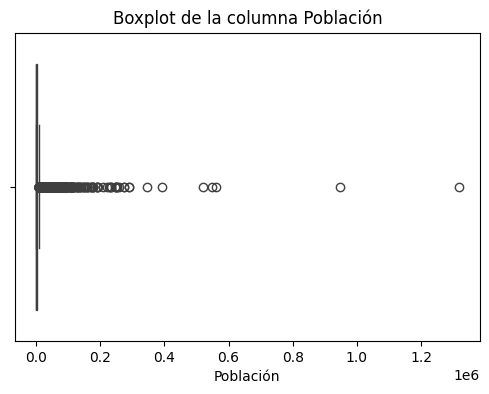

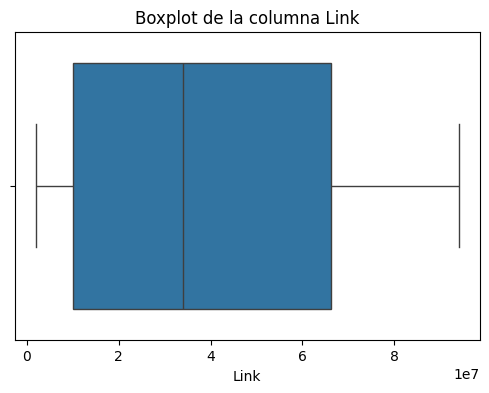

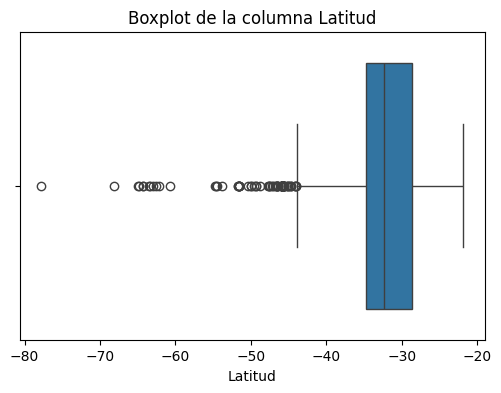

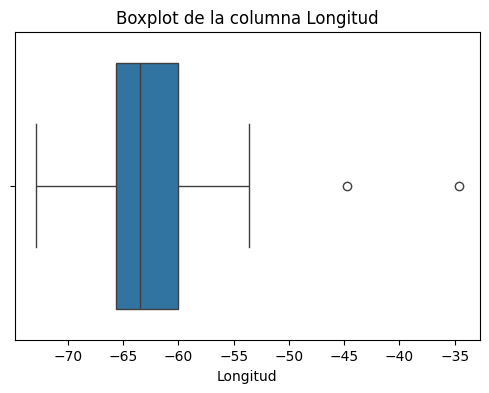

In [44]:
# Visualizar valores atípicos con un gráfico de caja
for columna in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[columna])
    plt.title(f"Boxplot de la columna {columna}")
    plt.show()

In [45]:
# Columnas a analizar para ver frecuencia de categorías
columnas_a_analizar = ['ADSL', 'Cablemódem', 'Dial Up', 'Fibra óptica', 'Satelital', 'Wireless', 'Telefonía Fija', '3G', '4G']

# Generar el conteo de categorías para las columnas especificadas
for col in columnas_a_analizar:
    print(f"\nConteo de categorías en la columna '{col}':")
    print(df[col].value_counts())


Conteo de categorías en la columna 'ADSL':
ADSL
--    3185
SI    1120
Name: count, dtype: int64

Conteo de categorías en la columna 'Cablemódem':
Cablemódem
--    3432
SI     873
Name: count, dtype: int64

Conteo de categorías en la columna 'Dial Up':
Dial Up
--    3902
SI     403
Name: count, dtype: int64

Conteo de categorías en la columna 'Fibra óptica':
Fibra óptica
--    2726
SI    1579
Name: count, dtype: int64

Conteo de categorías en la columna 'Satelital':
Satelital
--    3285
SI    1020
Name: count, dtype: int64

Conteo de categorías en la columna 'Wireless':
Wireless
SI    2260
--    2045
Name: count, dtype: int64

Conteo de categorías en la columna 'Telefonía Fija':
Telefonía Fija
--    2155
SI    2150
Name: count, dtype: int64

Conteo de categorías en la columna '3G':
3G
--    2359
SI    1946
Name: count, dtype: int64

Conteo de categorías en la columna '4G':
4G
SI    2228
--    2077
Name: count, dtype: int64


In [47]:
# 📌 Columnas a analizar para ver frecuencia de categorías
columnas_a_analizar = ['ADSL', 'Cablemódem', 'Dial Up', 'Fibra óptica', 'Satelital', 'Wireless', 'Telefonía Fija', '3G', '4G']

# 📌 Generar el conteo de categorías para las columnas especificadas
for col in columnas_a_analizar:
    if col in df.columns:  # Verificar si la columna existe
        print(f"\n🔹 Conteo de categorías en la columna '{col}':")
        print(df[col].value_counts(dropna=False))
    else:
        print(f"⚠️ La columna '{col}' no existe en el DataFrame.")


🔹 Conteo de categorías en la columna 'ADSL':
ADSL
--    3185
SI    1120
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Cablemódem':
Cablemódem
--    3432
SI     873
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Dial Up':
Dial Up
--    3902
SI     403
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Fibra óptica':
Fibra óptica
--    2726
SI    1579
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Satelital':
Satelital
--    3285
SI    1020
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Wireless':
Wireless
SI    2260
--    2045
Name: count, dtype: int64

🔹 Conteo de categorías en la columna 'Telefonía Fija':
Telefonía Fija
--    2155
SI    2150
Name: count, dtype: int64

🔹 Conteo de categorías en la columna '3G':
3G
--    2359
SI    1946
Name: count, dtype: int64

🔹 Conteo de categorías en la columna '4G':
4G
SI    2228
--    2077
Name: count, dtype: int64


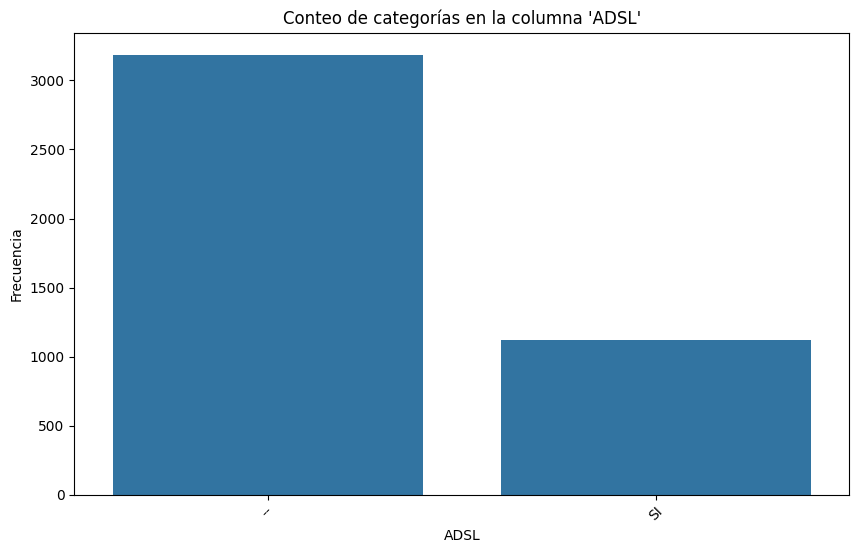

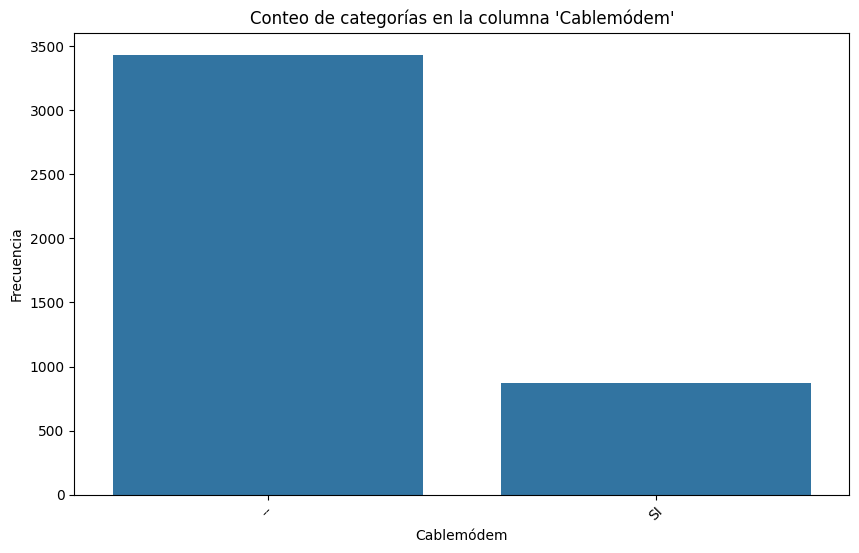

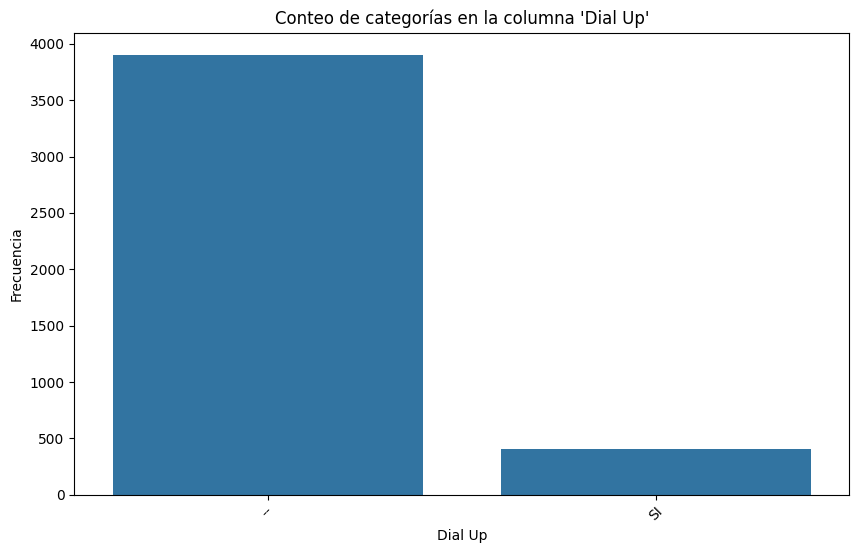

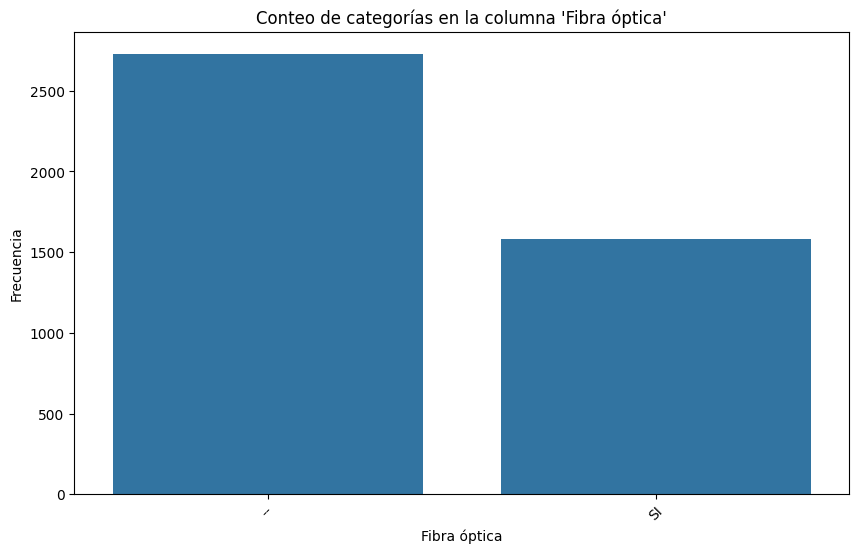

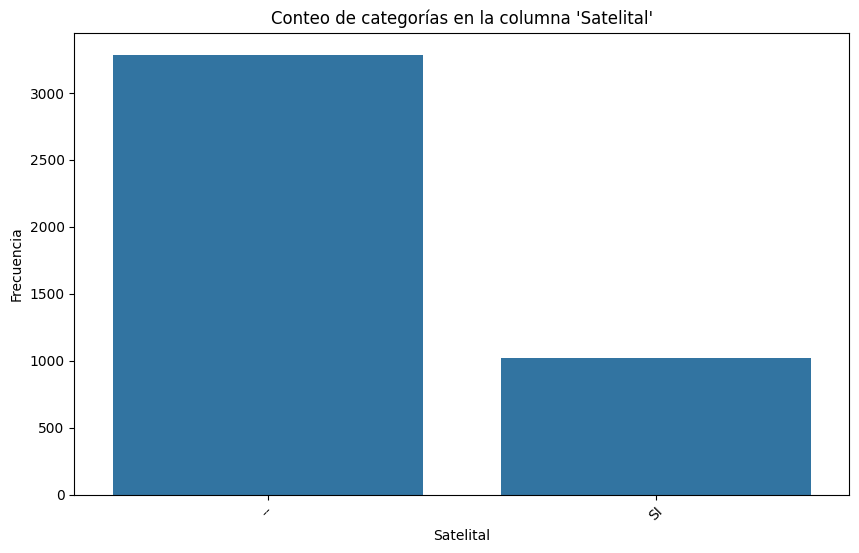

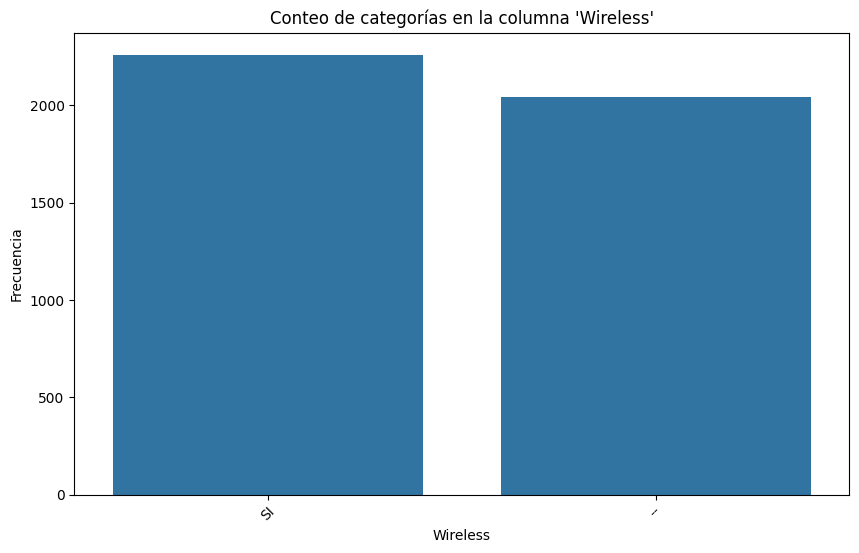

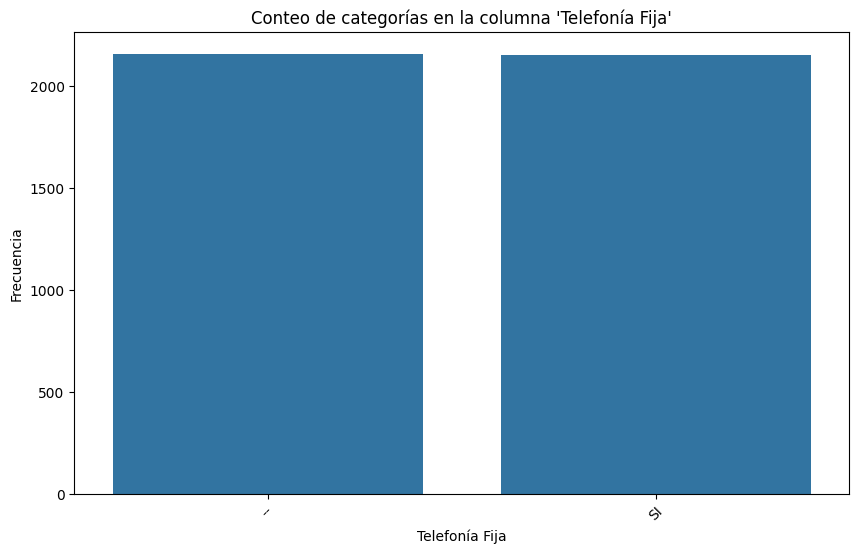

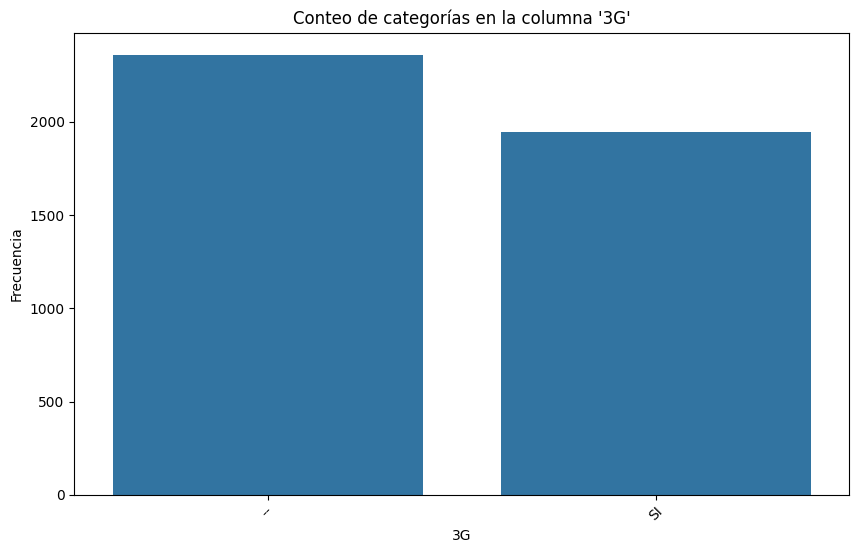

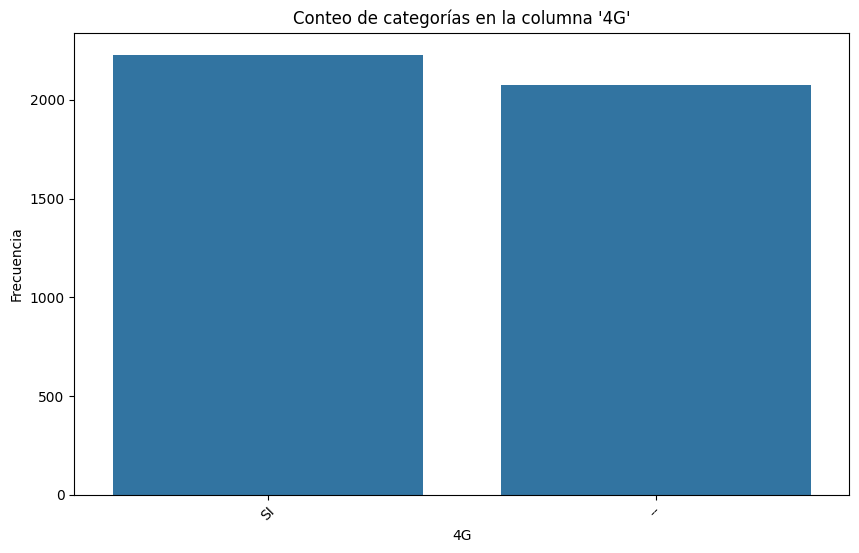

In [48]:
# 📌 Graficar el conteo de categorías para las columnas especificadas
for col in columnas_a_analizar:
    if col in df.columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(data=df, x=col, order=df[col].value_counts().index)
        plt.title(f"Conteo de categorías en la columna '{col}'")
        plt.xlabel(col)
        plt.ylabel('Frecuencia')
        plt.xticks(rotation=45)  # Rotar etiquetas si son muchas
        plt.show()


In [59]:
# Conteo de categorías en columnas de tipo object
for col in df.select_dtypes(include=['object']).columns:
    print(f"\nConteo de categorías en la columna '{col}':")
    print(df[col].value_counts())


Conteo de categorías en la columna 'Provincia':
Provincia
BUENOS AIRES           900
CORDOBA                556
SANTA FE               388
SAN LUIS               229
MENDOZA                209
ENTRE RIOS             192
CATAMARCA              182
SANTIAGO DEL ESTERO    165
RIO NEGRO              162
JUJUY                  160
MISIONES               143
SALTA                  139
TUCUMAN                116
SAN JUAN               108
CHACO                   92
LA RIOJA                92
CHUBUT                  90
LA PAMPA                89
CORRIENTES              78
FORMOSA                 63
NEUQUEN                 61
CABA                    48
SANTA CRUZ              27
TIERRA DEL FUEGO        16
Name: count, dtype: int64

Conteo de categorías en la columna 'Partido':
Partido
General Roca               84
Santa Maria                71
San Justo                  62
Colon                      61
La Capital                 55
                           ..
Comuna 02                   1
Pr


Estadísticas descriptivas del DataFrame (incluyendo todas las columnas):
           Provincia       Partido  Localidad     Población  ADSL Cablemódem  \
count           4305          4305       4305  4.305000e+03  4305       4305   
unique            24           444       3890           NaN     2          2   
top     BUENOS AIRES  General Roca  San Pedro           NaN    --         --   
freq             900            84         12           NaN  3185       3432   
mean             NaN           NaN        NaN  8.707207e+03   NaN        NaN   
std              NaN           NaN        NaN  3.824490e+04   NaN        NaN   
min              NaN           NaN        NaN  0.000000e+00   NaN        NaN   
25%              NaN           NaN        NaN  1.170000e+02   NaN        NaN   
50%              NaN           NaN        NaN  5.790000e+02   NaN        NaN   
75%              NaN           NaN        NaN  3.217000e+03   NaN        NaN   
max              NaN           NaN        NaN 

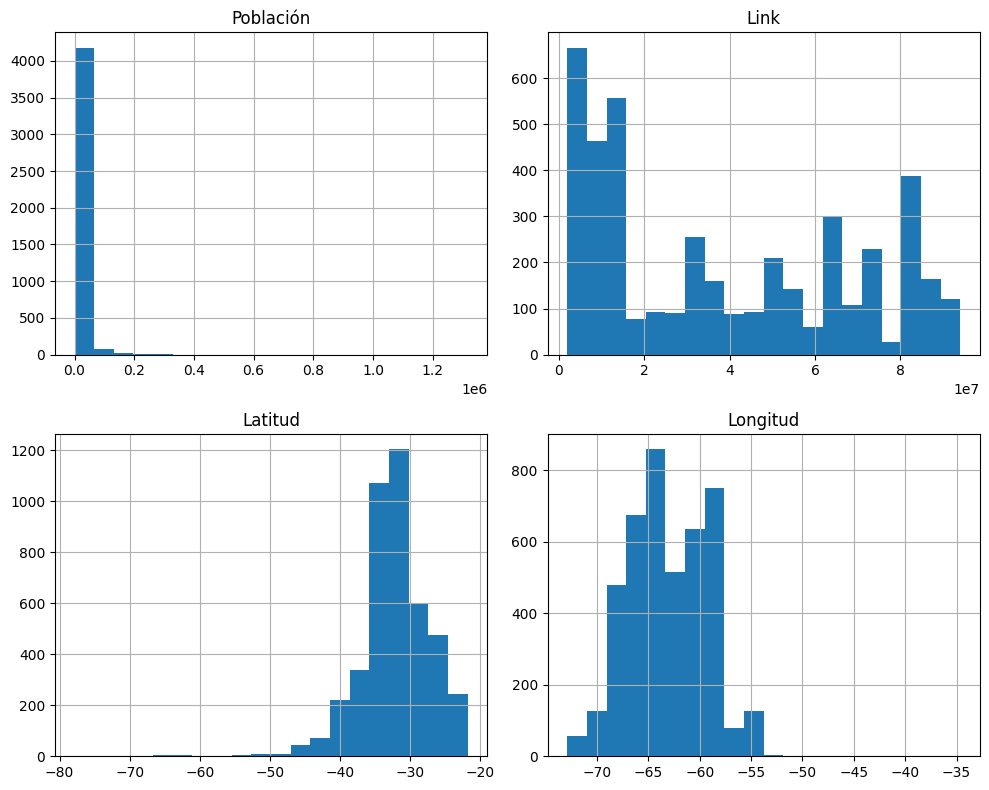

In [60]:
# 3: Estadísticas descriptivas y análisis exploratorio

# Estadísticas descriptivas para columnas numéricas y de tipo object
print("\nEstadísticas descriptivas del DataFrame (incluyendo todas las columnas):")
print(df.describe(include='all'))

# Histogramas de las columnas numéricas
df.select_dtypes(include=[np.number]).hist(bins=20, figsize=(10, 8))
plt.tight_layout()
plt.show()

In [52]:
import pandas as pd
import unidecode

# 📌 Función para normalizar nombres manteniendo formato adecuado
def normalizar_texto(texto, tipo="general"):
    if isinstance(texto, str):
        texto = texto.strip()  # Eliminar espacios extras
        texto = unidecode.unidecode(texto)  # Eliminar tildes
        texto = texto.lower()  # Convertir a minúsculas
        
        if tipo == "provincia":
            return texto.upper()  # Provincias en mayúsculas
        elif tipo in ["partido", "localidad"]:
            return texto.title()  # Capitalizar primera letra
    return texto  # Si no es string, devolver igual



In [53]:
# 📌 Verificar nombres únicos de provincias antes de la normalización
provincias_unicas = df['Provincia'].unique()
print("🔹 Provincias encontradas antes de normalización:")
print(provincias_unicas)

🔹 Provincias encontradas antes de normalización:
['BUENOS AIRES' 'SAN LUIS' 'CABA' 'CORDOBA' 'LA PAMPA' 'RIO NEGRO'
 'SANTA FE' 'TIERRA DEL FUEGO' 'TUCUMAN' 'CHUBUT' 'JUJUY' 'LA RIOJA'
 'SANTA CRUZ' 'CATAMARCA' 'CHACO' 'CORRIENTES' 'MENDOZA' 'SALTA'
 'ENTRE RIOS' 'SANTIAGO DEL ESTERO' 'MISIONES' 'FORMOSA' 'SAN JUAN'
 'NEUQUEN']


In [54]:
# 📌 Verificar nombres únicos de localidades antes de la normalización
localidades_unicas = df['Localidad'].unique()
print("🔹 Localidades encontradas antes de normalización:")
print(localidades_unicas)

🔹 Localidades encontradas antes de normalización:
['25 de Mayo' 'Agustín Mosconi' 'Del Valle' ... 'Videla' 'Aldao'
 'Capitán Bermúdez']


In [55]:
# 📌 Verificar nombres únicos de partidos antes de la normalización
partidos_unicos = df['Partido'].unique()
print("🔹 Partidos encontrados antes de normalización:")
print(partidos_unicos)

🔹 Partidos encontrados antes de normalización:
['25 de Mayo' '9 de Julio' 'Alberti' 'Almirante Brown' 'La Matanza'
 'Pilar' 'Tigre' 'Tordillo' 'Tornquist' 'Trenque Lauquen' 'Junín'
 'COMUNA 01' 'San Justo' 'COMUNA 11' 'Hucal' 'Lihuel Calel' 'Santa María'
 'Limay Mahuida' 'Loventué' 'Maracó' 'Puelén' 'Adolfo Alsina' 'Avellaneda'
 'Belgrano' 'La Capital' 'Libertador Grl. San Martín' 'Pinamar'
 'Presidente Perón' 'Puán' 'Río Grande' 'Ushuaia' 'Burruyacú' 'Leales'
 'Lules' 'Monteros' 'Cañuelas' 'Capitán Sarmiento' 'Carlos Casares'
 'Tres Arroyos' 'COMUNA 12' 'Quemú Quemú' 'Rawson' 'Río Senguer'
 'Sarmiento' 'Tehuelches' 'Rancul' 'Realicó' 'Bariloche' 'Caseros'
 'Capital' 'Chicligasta' 'Cruz Alta' 'Adolfo Gonzales Chaves'
 'Carlos Tejedor' 'Carmen de Areco' 'Castelli' 'La Plata'
 'Tres De Febrero' 'Totoral' 'Tulumba' 'Toay' 'Unión'
 'Doctor Manuel Belgrano' 'El Carmen' 'Saavedra' 'Saladillo' 'Salliqueló'
 'Trenel' 'Utracán' 'Arauco' 'Conesa' 'El Cuy' 'General Roca'
 'Corpen Aike' 'Deseado' 

In [56]:
# 📌 Aplicar normalización con formato adecuado
df['Provincia'] = df['Provincia'].apply(lambda x: normalizar_texto(x, "provincia"))
df['Partido'] = df['Partido'].apply(lambda x: normalizar_texto(x, "partido"))
df['Localidad'] = df['Localidad'].apply(lambda x: normalizar_texto(x, "localidad"))


In [57]:
## 📌 Establecer nombres estándar en un diccionario
#nombres_provincias_estandarizados = {
#    "CIUDAD AUTONOMA DE BUENOS AIRES": "CABA",  # Convertir CABA a formato estándar
#    "BUENOS AIRES": "PROVINCIA DE BUENOS AIRES",
#    "BS.AS.": "PROVINCIA DE BUENOS AIRES",
#}

## 📌 Reemplazar nombres normalizados con su versión estándar
#df['Provincia'] = df['Provincia'].replace(nombres_provincias_estandarizados)
#
# 📌 Asegurar tipos de datos adecuados
df[['Latitud', 'Longitud']] = df[['Latitud', 'Longitud']].astype(float)

# 📌 Mostrar resultados finales
print("🔹 Provincias normalizadas:")
print(df['Provincia'].unique())

print("🔹 Localidades normalizadas:")
print(df['Localidad'].unique())

print("🔹 Partidos normalizados:")
print(df['Partido'].unique())


🔹 Provincias normalizadas:
['BUENOS AIRES' 'SAN LUIS' 'CABA' 'CORDOBA' 'LA PAMPA' 'RIO NEGRO'
 'SANTA FE' 'TIERRA DEL FUEGO' 'TUCUMAN' 'CHUBUT' 'JUJUY' 'LA RIOJA'
 'SANTA CRUZ' 'CATAMARCA' 'CHACO' 'CORRIENTES' 'MENDOZA' 'SALTA'
 'ENTRE RIOS' 'SANTIAGO DEL ESTERO' 'MISIONES' 'FORMOSA' 'SAN JUAN'
 'NEUQUEN']
🔹 Localidades normalizadas:
['25 De Mayo' 'Agustin Mosconi' 'Del Valle' ... 'Videla' 'Aldao'
 'Capitan Bermudez']
🔹 Partidos normalizados:
['25 De Mayo' '9 De Julio' 'Alberti' 'Almirante Brown' 'La Matanza'
 'Pilar' 'Tigre' 'Tordillo' 'Tornquist' 'Trenque Lauquen' 'Junin'
 'Comuna 01' 'San Justo' 'Comuna 11' 'Hucal' 'Lihuel Calel' 'Santa Maria'
 'Limay Mahuida' 'Loventue' 'Maraco' 'Puelen' 'Adolfo Alsina' 'Avellaneda'
 'Belgrano' 'La Capital' 'Libertador Grl. San Martin' 'Pinamar'
 'Presidente Peron' 'Puan' 'Rio Grande' 'Ushuaia' 'Burruyacu' 'Leales'
 'Lules' 'Monteros' 'Canuelas' 'Capitan Sarmiento' 'Carlos Casares'
 'Tres Arroyos' 'Comuna 12' 'Quemu Quemu' 'Rawson' 'Rio Senguer'
 '

In [58]:
# Guardar los cambios en el archivo CSV original
df.to_csv(ruta_completa, index=False)
print(f"\nArchivo guardado: {ruta_completa}")


Archivo guardado: C:\Users\USUARIO\OneDrive - Secretaria de Educacion del Distrito\Escritorio\SOYhENRY\PI_21\PI_2_DA_corregido\data_internet_ind\mapa_conectividad.csv


In [62]:
from scipy.stats import zscore

# Identificar outliers usando el método Z-score

z_scores = np.abs(zscore(df.select_dtypes(include=[np.number])))
outliers_zscore = np.where(z_scores > 3)

print("\nOutliers identificados usando el método Z-score:")
print(outliers_zscore)

# Identificar outliers usando el método IQR
numeric_df = df.select_dtypes(include=[np.number])
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

outliers_iqr = numeric_df[((numeric_df < (Q1 - 1.5 * IQR)) | (numeric_df > (Q3 + 1.5 * IQR))).any(axis=1)]

print("\nOutliers identificados usando el método IQR:")
print(outliers_iqr)


Outliers identificados usando el método Z-score:
(array([  20,   21,   22,   25,  141,  177,  178,  179,  180,  233,  234,
        238,  358,  454,  480,  584,  585,  593,  594,  595,  596,  597,
        598,  599,  600,  601,  602,  603,  604,  781,  809,  828,  833,
        834,  886,  917, 1016, 1020, 1091, 1123, 1174, 1189, 1348, 1650,
       2004, 2098, 2138, 2211, 2352, 2372, 2373, 2406, 2582, 2628, 2690,
       2751, 2751, 2752, 2753, 2754, 2755, 2756, 2757, 2757, 2758, 2759,
       2760, 2761, 2762, 2843, 2909, 2911, 3091, 3344, 3372, 3482, 3483,
       3591, 3850, 3950, 4047, 4107, 4113, 4156, 4270, 4271, 4272, 4273]), array([0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2,
       2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2]))

Outliers identificados usando el método IQR:
      Población        

Análisis Univariado

Análisis Bivariado y Multivariado

In [64]:
# Correlación entre columnas no numéricas usando tablas de contingencia
for col1 in df.select_dtypes(include=['object']).columns:
    for col2 in df.select_dtypes(include=['object']).columns:
        if col1 != col2:
            tabla_contingencia = pd.crosstab(df[col1], df[col2])
            print(f"Tabla de contingencia entre {col1} y {col2}:")
            print(tabla_contingencia)

Tabla de contingencia entre Provincia y Partido:
Partido              12 De Octubre  1O De Mayo  2 De Abril  25 De Mayo  \
Provincia                                                                
BUENOS AIRES                     0           0           0          10   
CABA                             0           0           0           0   
CATAMARCA                        0           0           0           0   
CHACO                            5           3           2           3   
CHUBUT                           0           0           0           0   
CORDOBA                          0           0           0           0   
CORRIENTES                       0           0           0           0   
ENTRE RIOS                       0           0           0           0   
FORMOSA                          0           0           0           0   
JUJUY                            0           0           0           0   
LA PAMPA                         0           0           0     

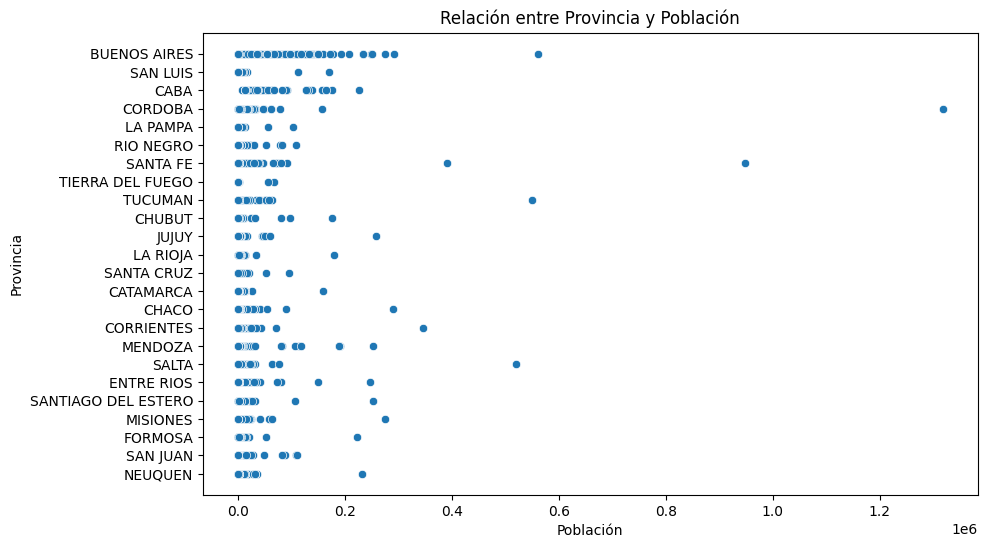

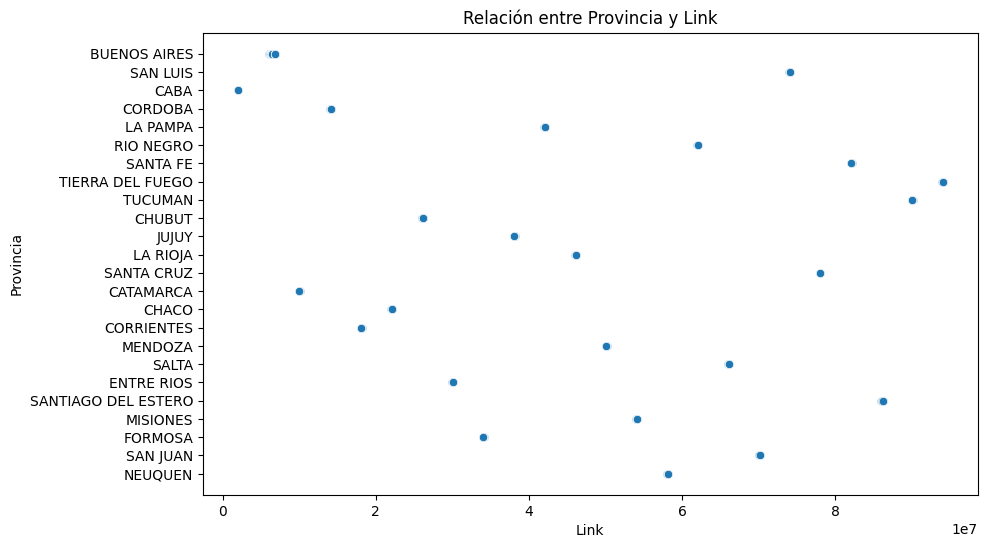

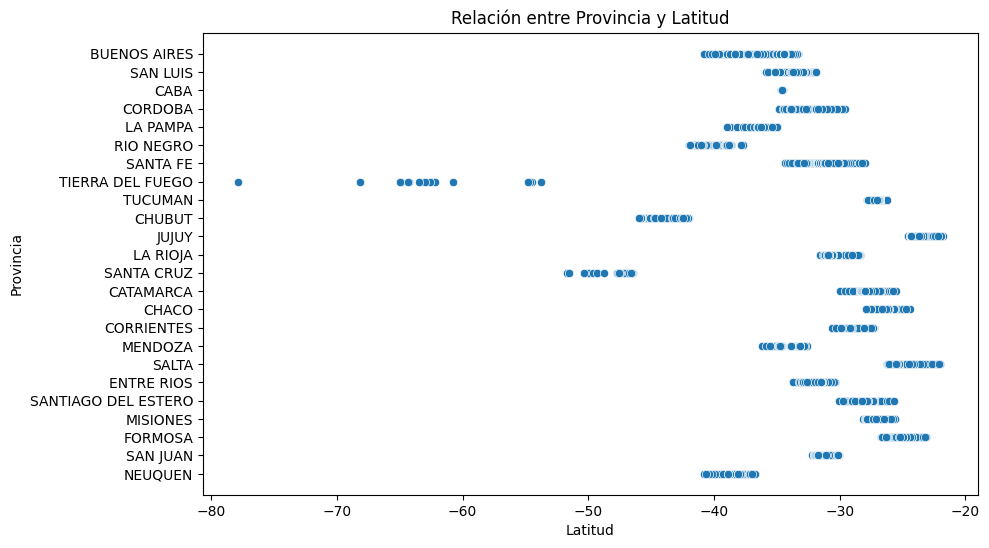

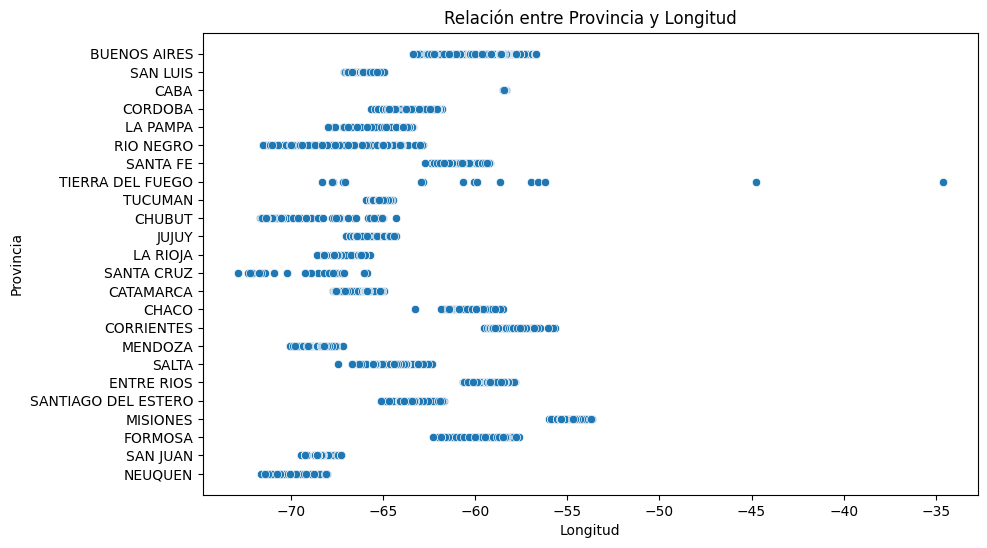

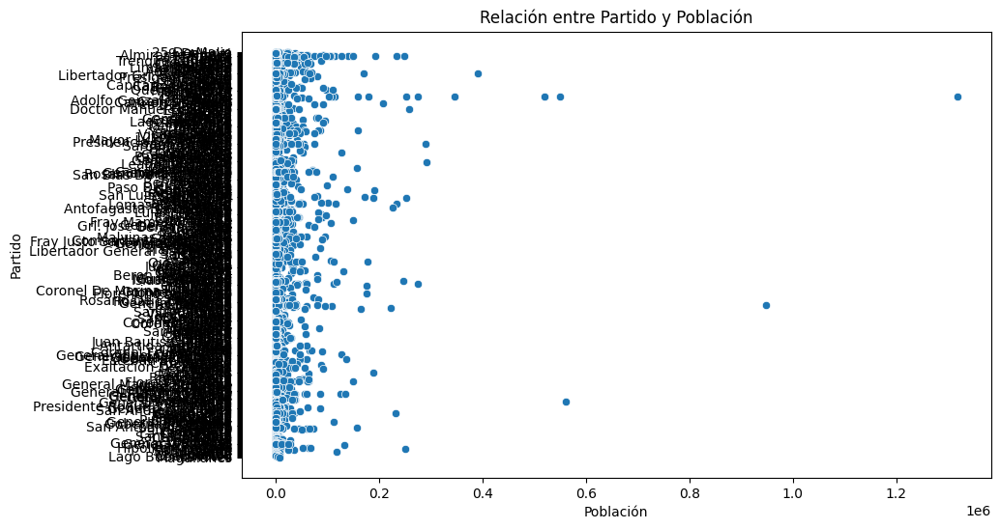

...

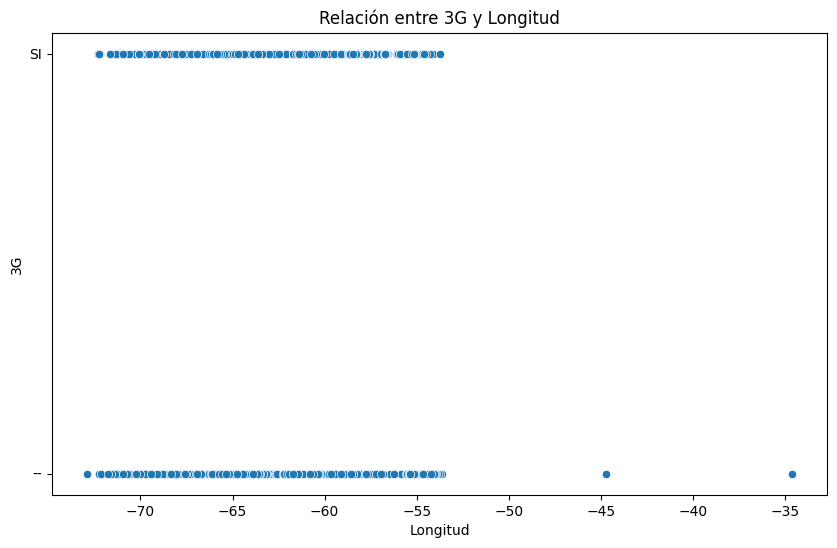

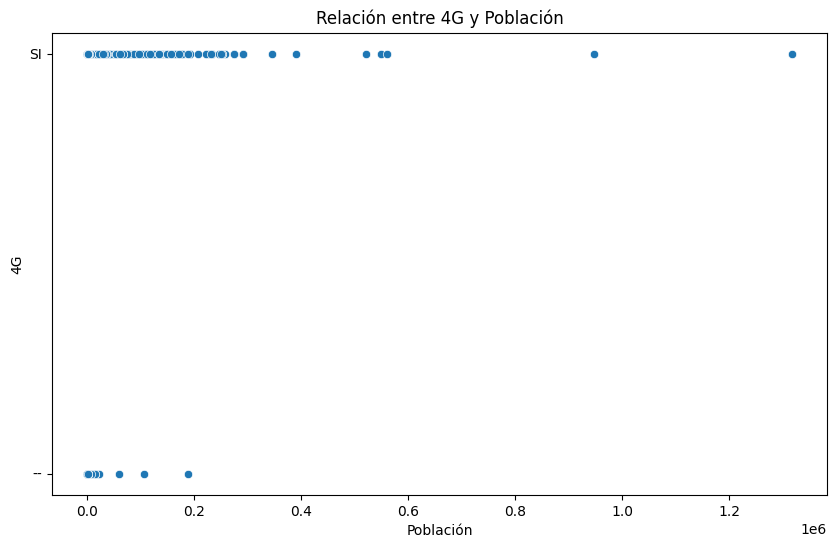

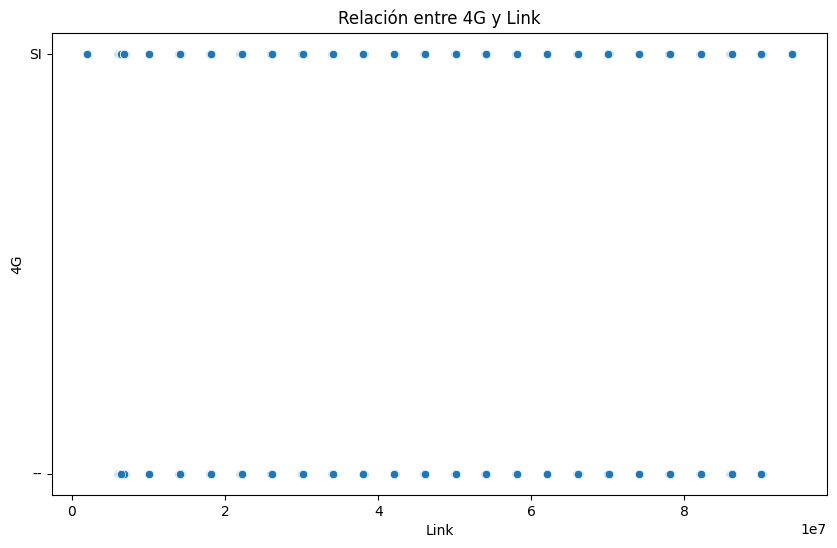

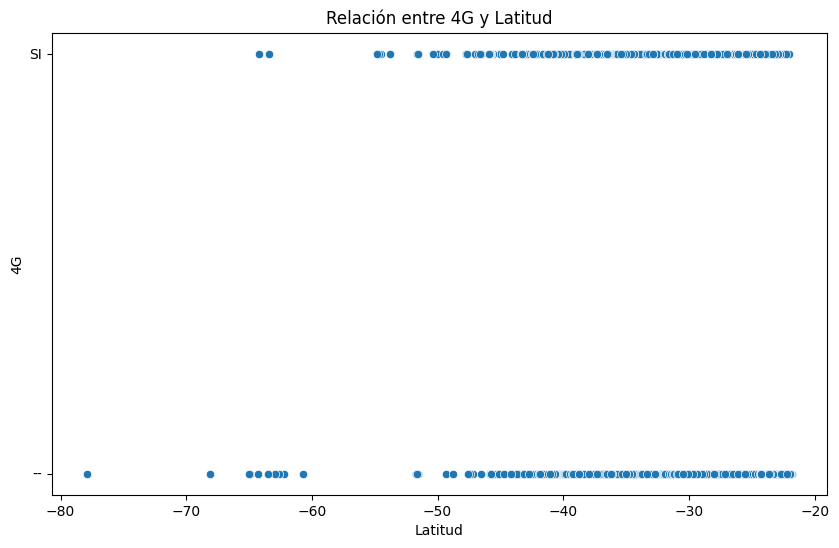

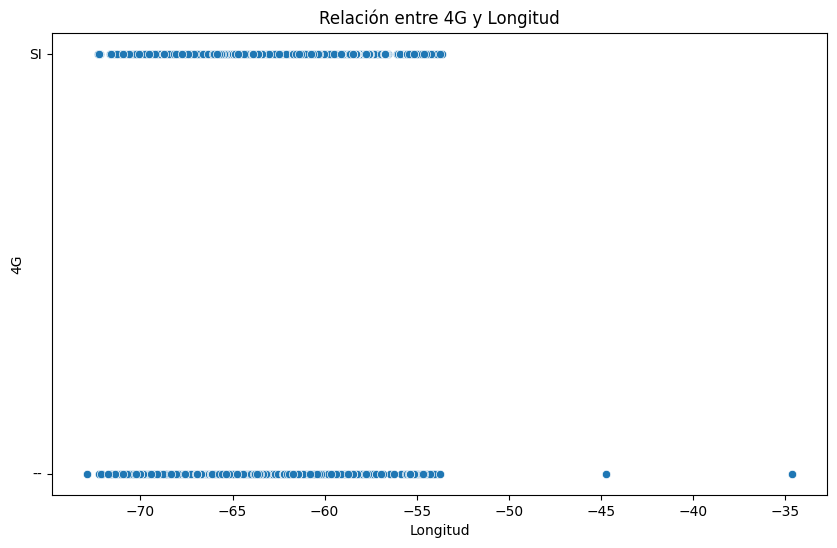

In [65]:
# Explorar relaciones entre variables categóricas y numéricas con gráficos de dispersión
for cat_col in df.select_dtypes(include=['object']).columns:
    for num_col in df.select_dtypes(include=[np.number]).columns:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=num_col, y=cat_col)
        plt.title(f"Relación entre {cat_col} y {num_col}")
        plt.show()

Visualización de Datos

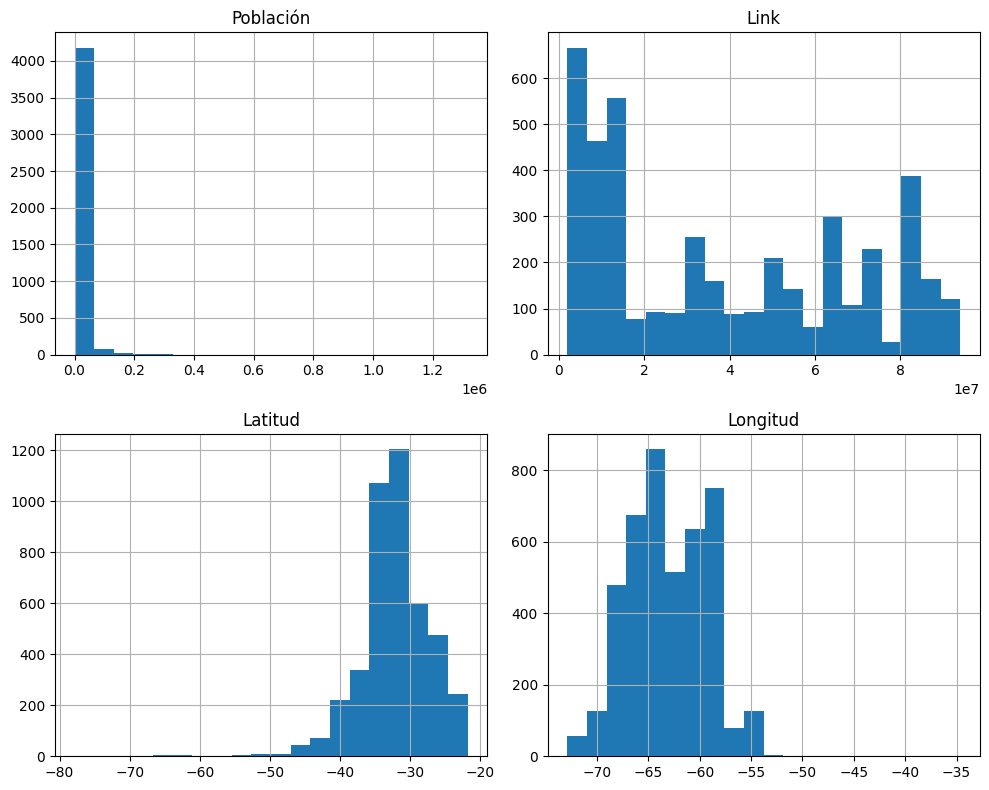

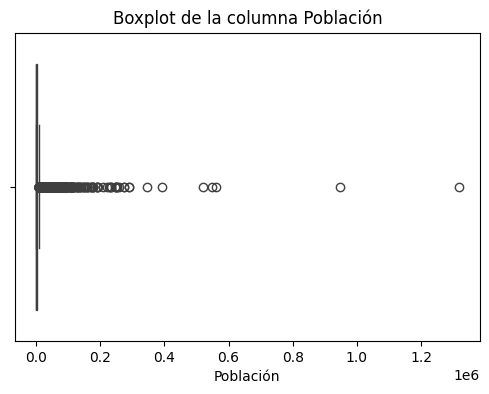

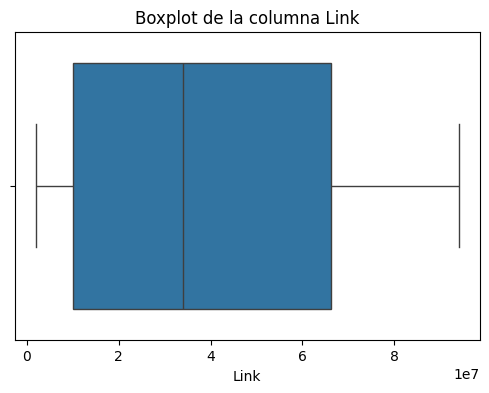

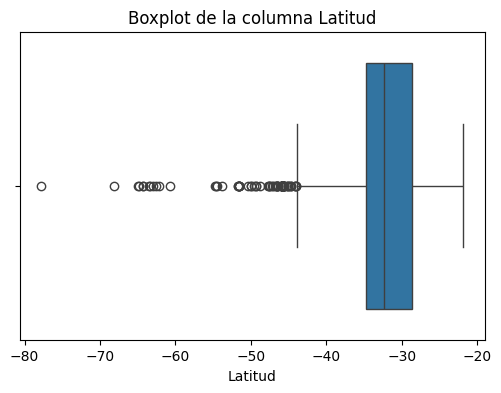

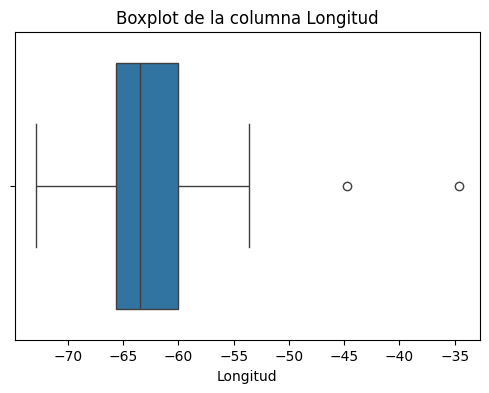

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1631257894.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[columna], shade=True)


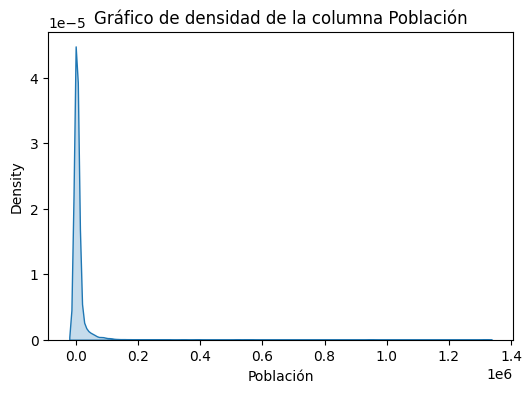

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1631257894.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[columna], shade=True)


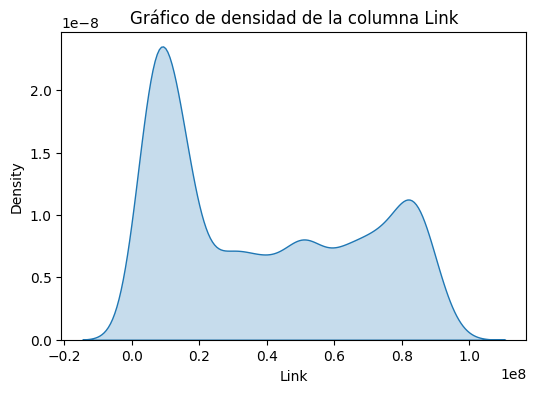

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1631257894.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[columna], shade=True)


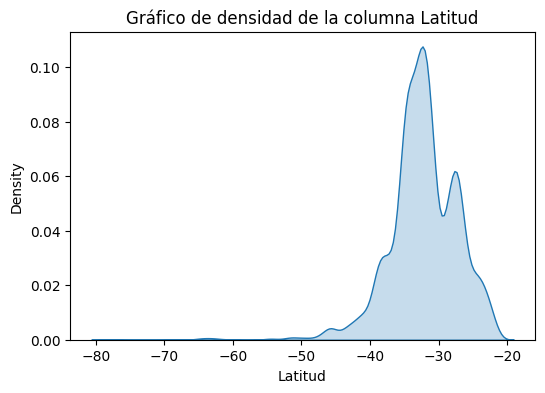

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1631257894.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[columna], shade=True)


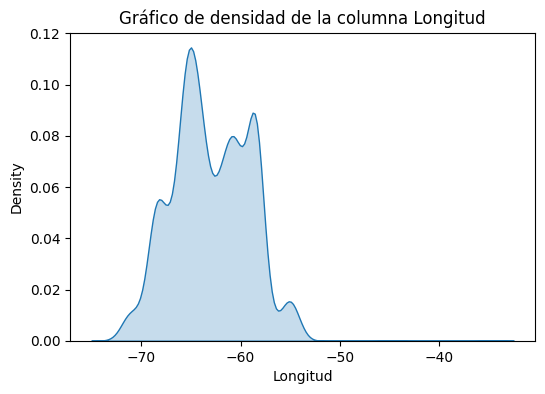

In [66]:
# Histogramas
df.select_dtypes(include=[np.number]).hist(bins=20, figsize=(10, 8))
plt.tight_layout()
plt.show()

# Boxplots
for columna in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[columna])
    plt.title(f"Boxplot de la columna {columna}")
    plt.show()

# Gráficos de densidad
for columna in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df[columna], shade=True)
    plt.title(f"Gráfico de densidad de la columna {columna}")
    plt.show()

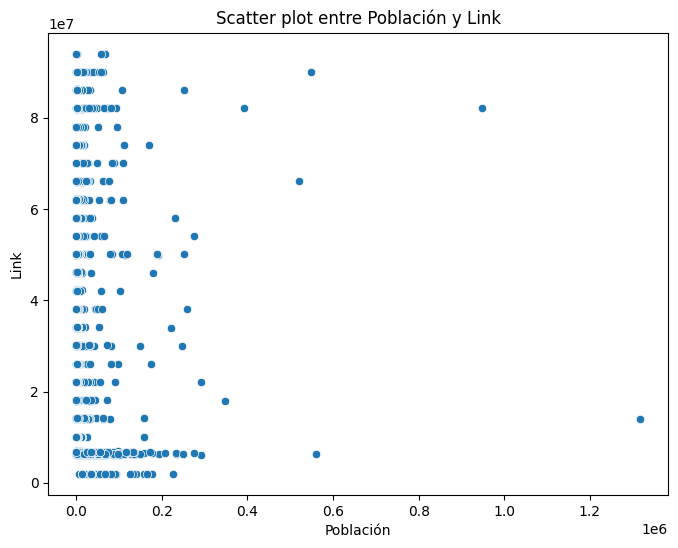

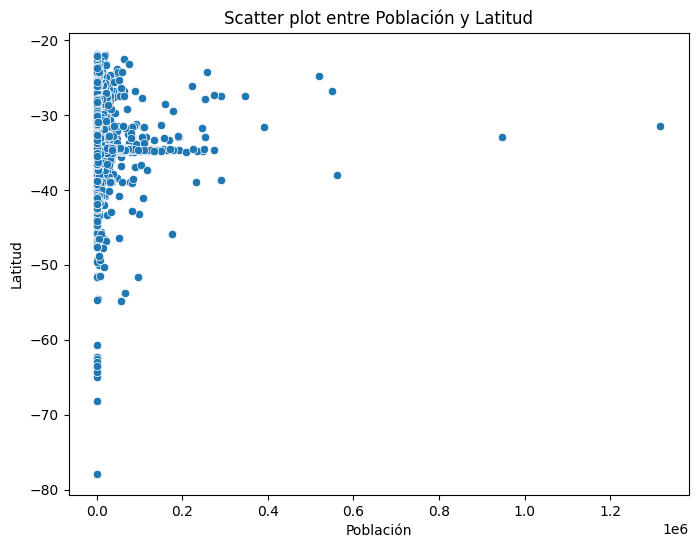

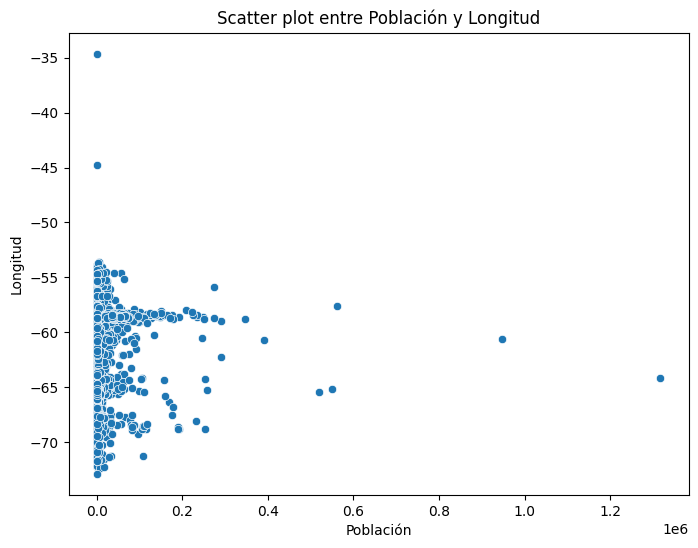

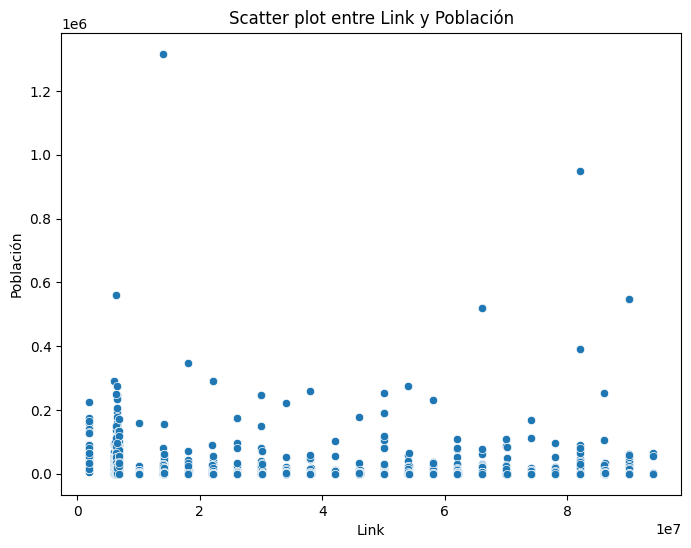

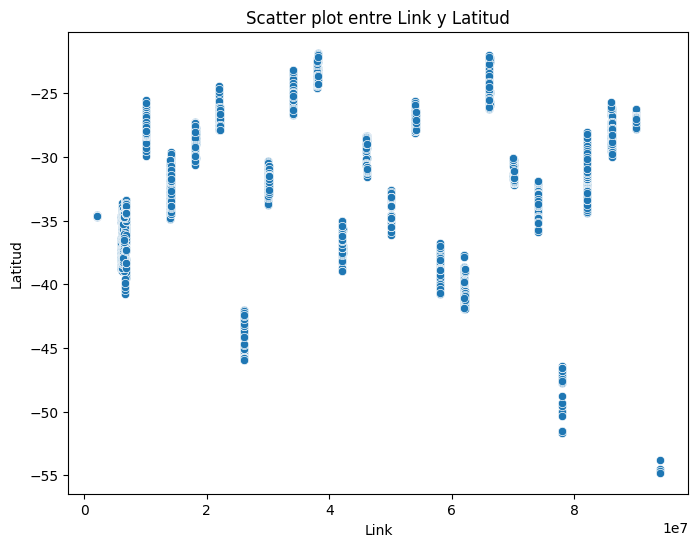

...

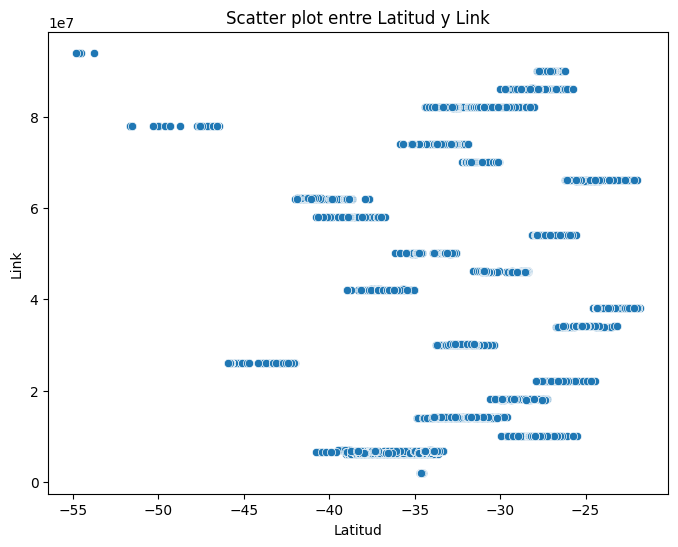

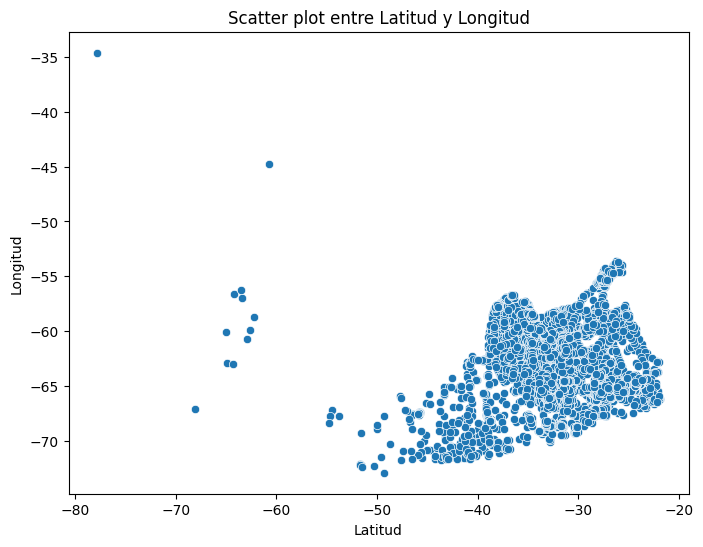

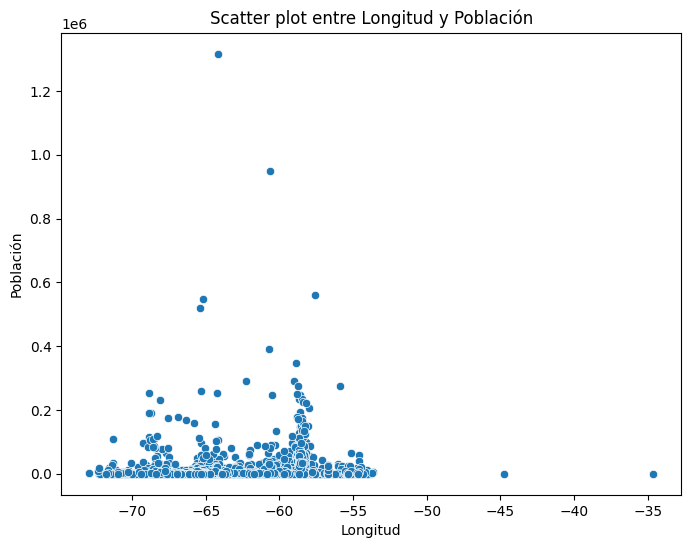

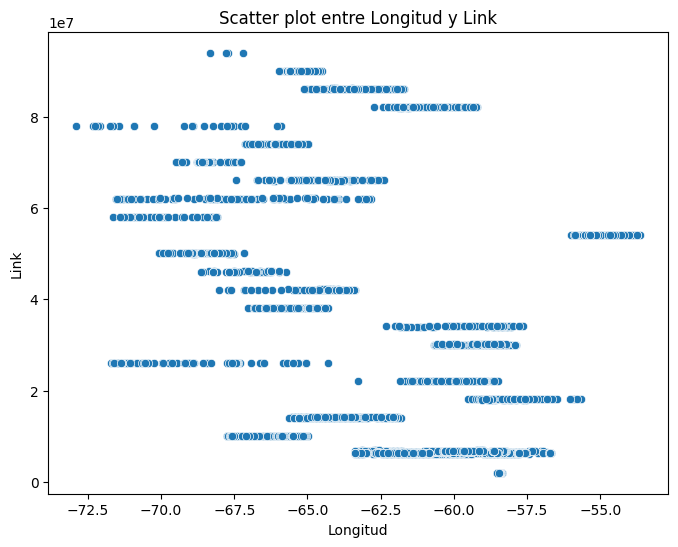

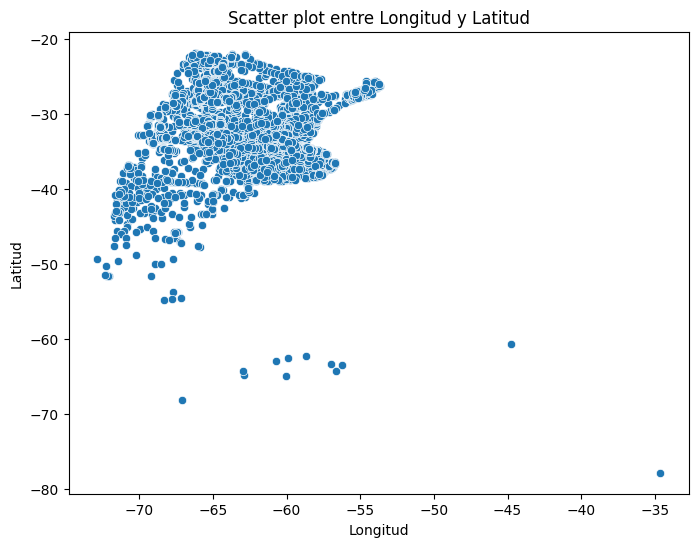

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


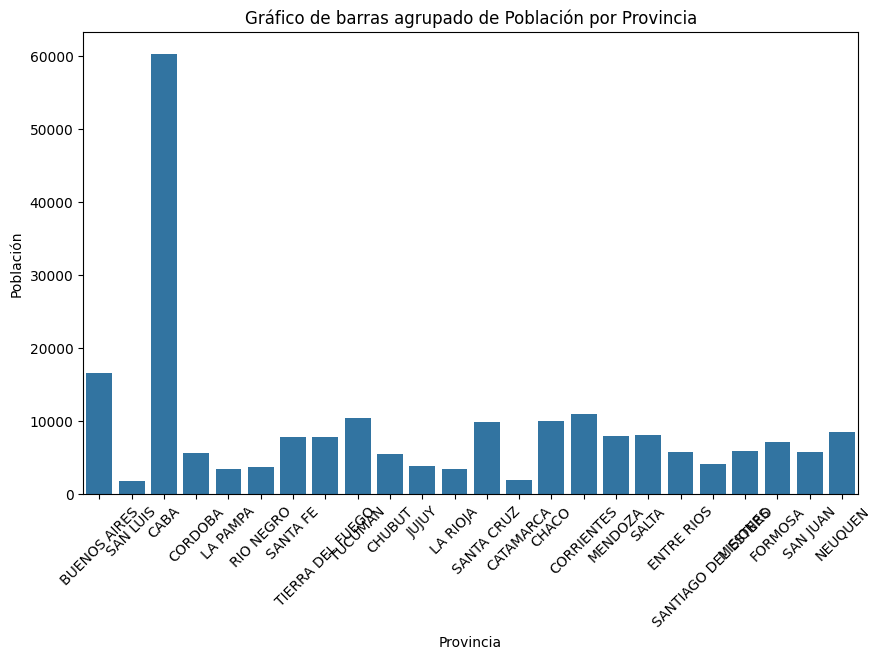

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


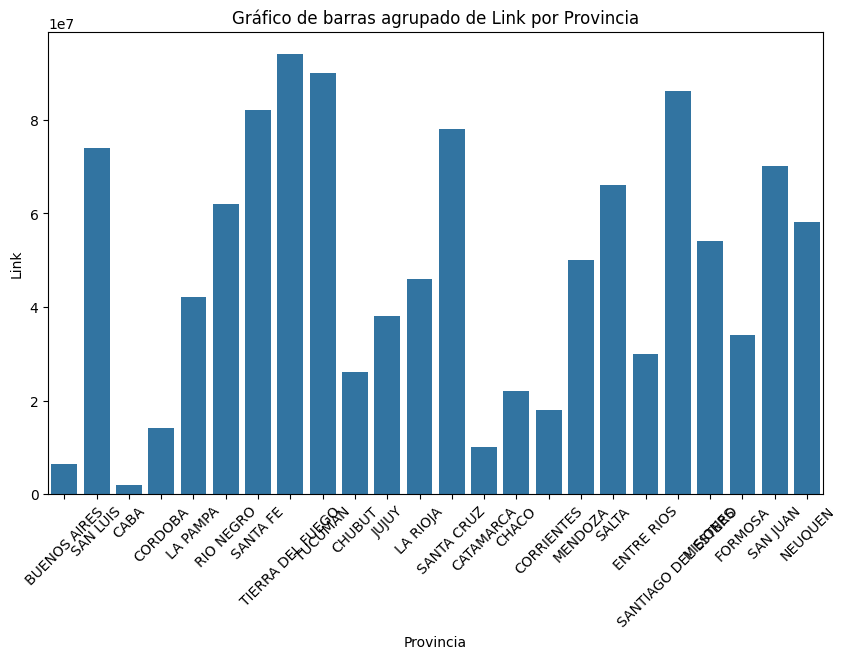

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


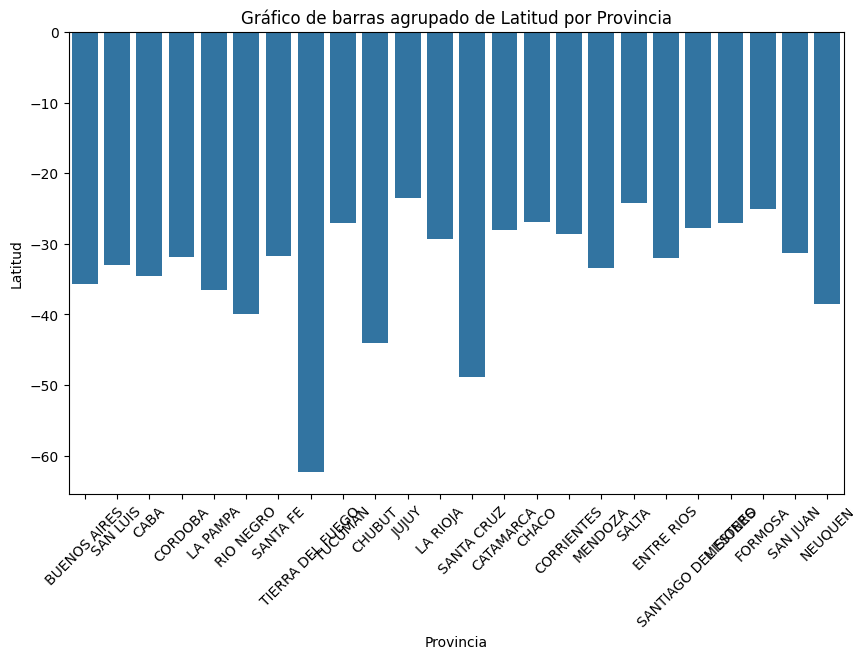

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


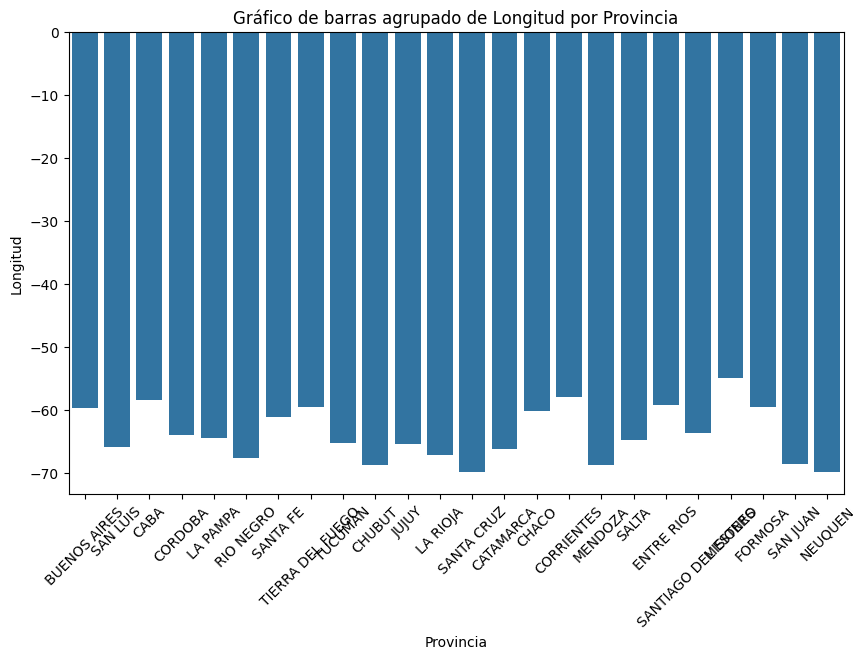

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


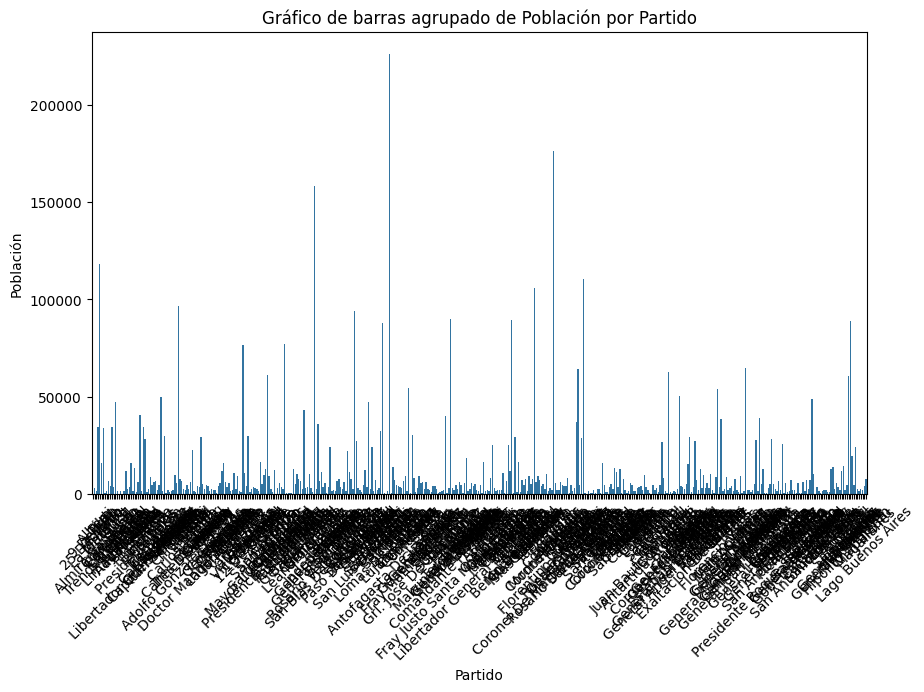

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


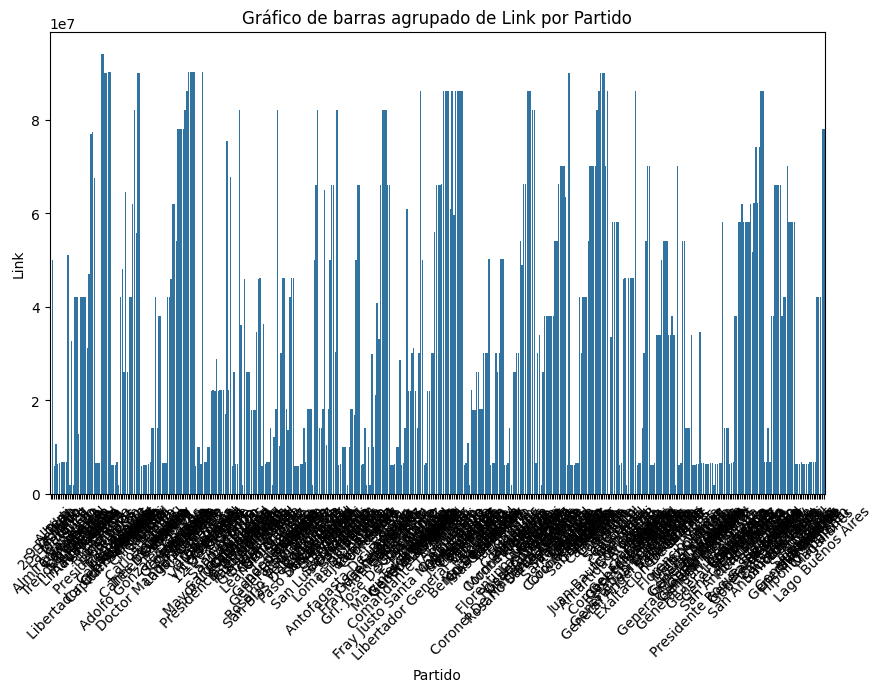

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


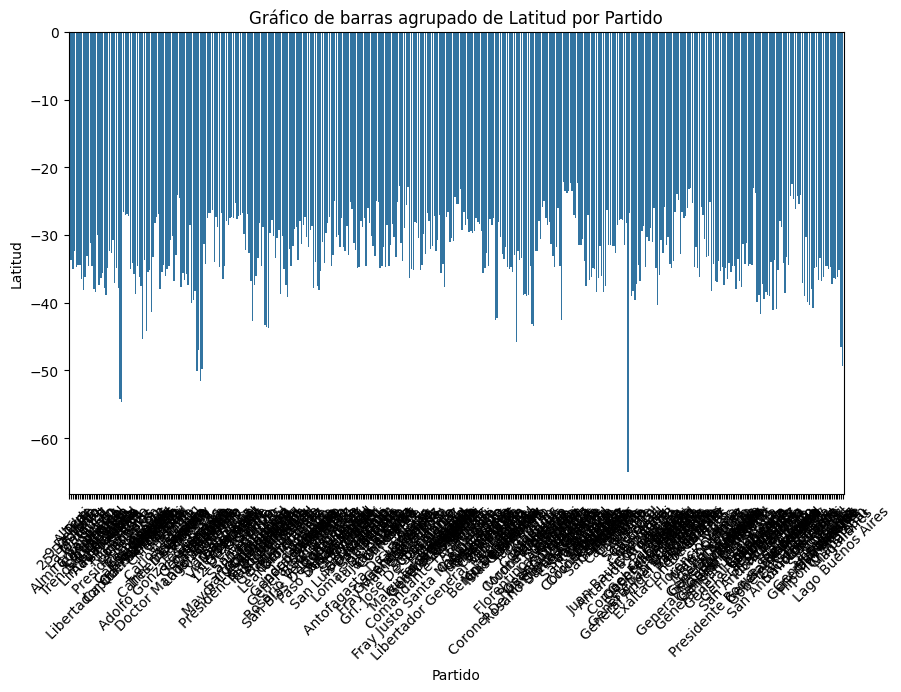

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


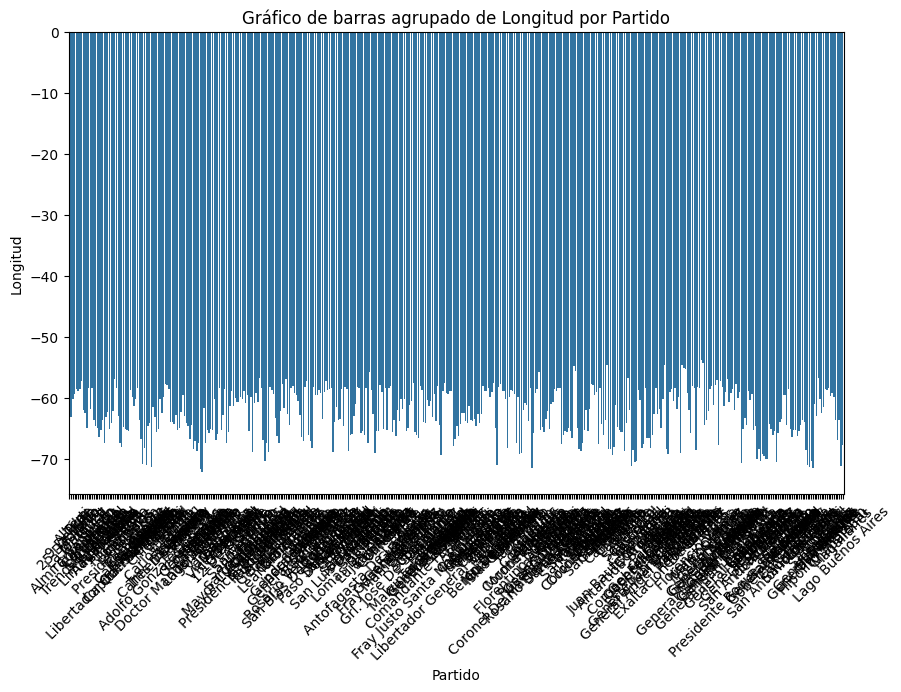

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


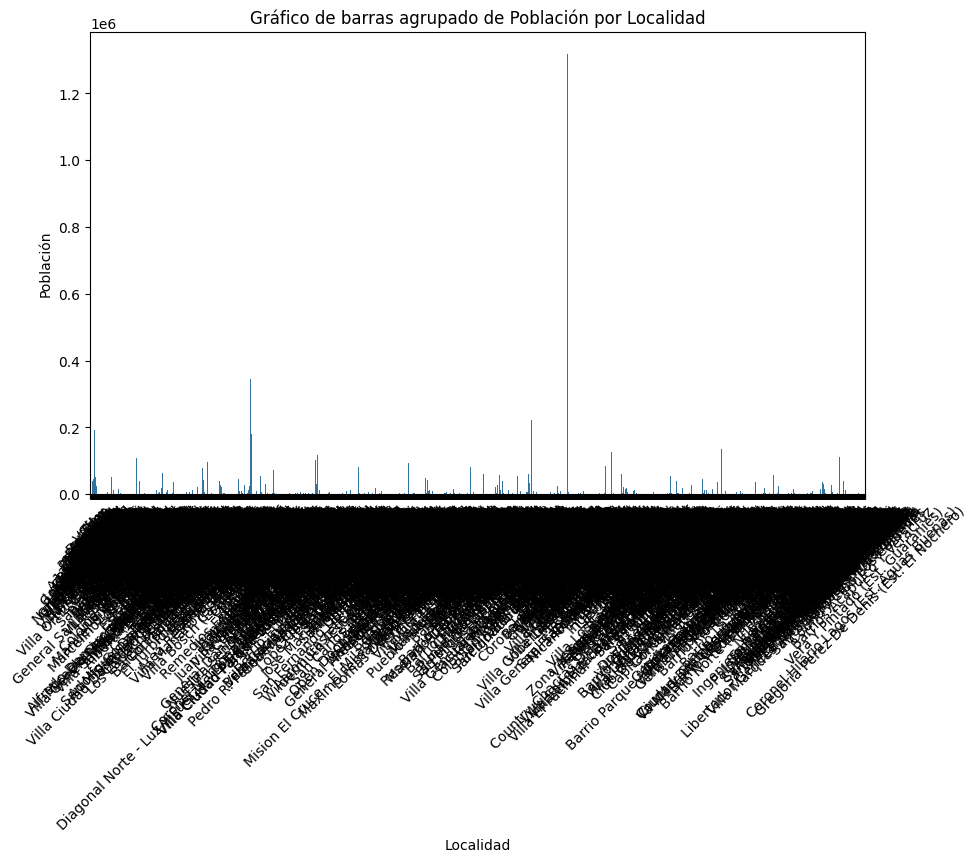

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


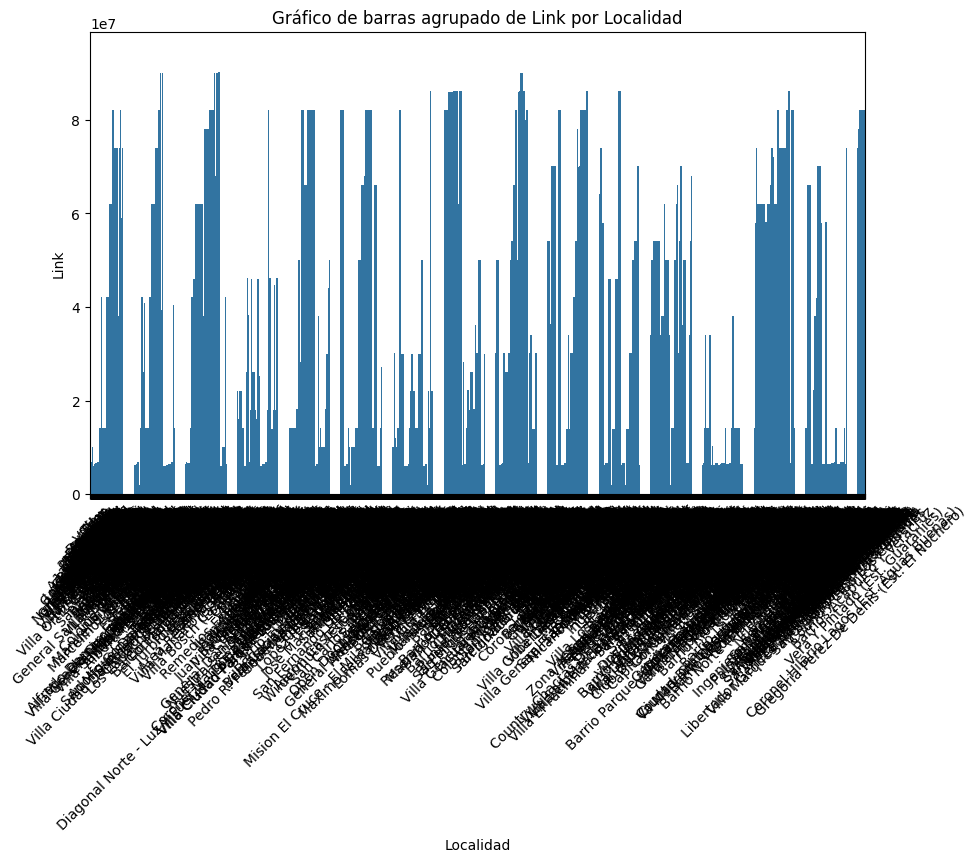

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


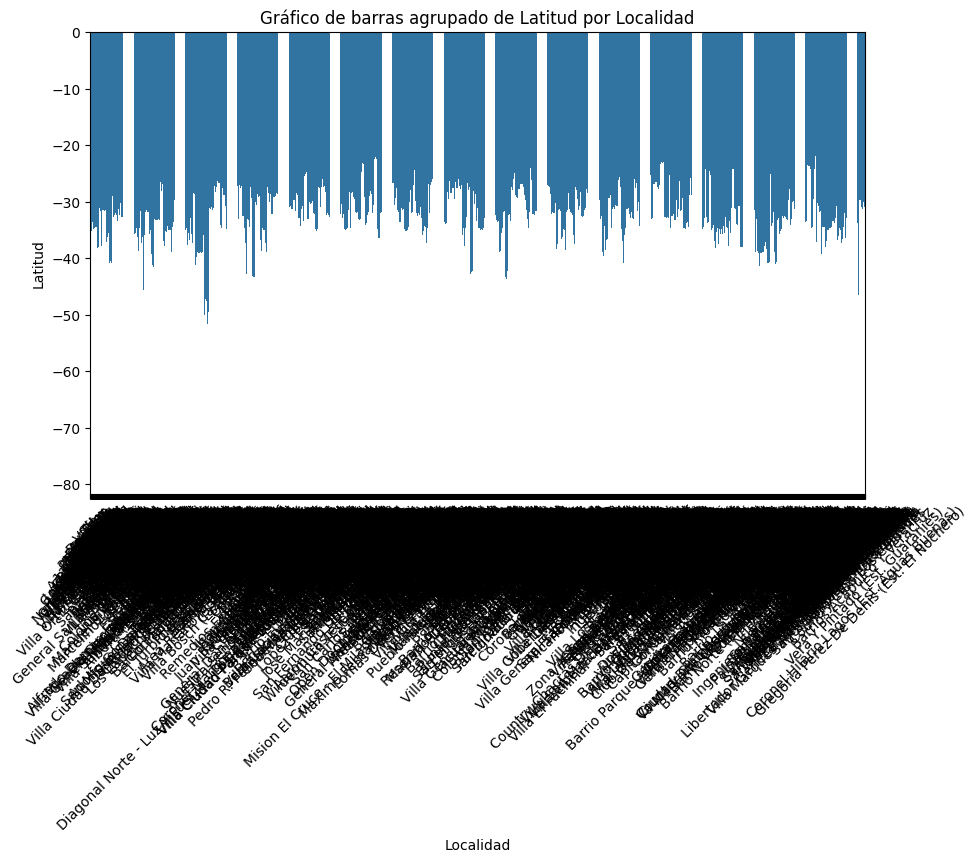

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


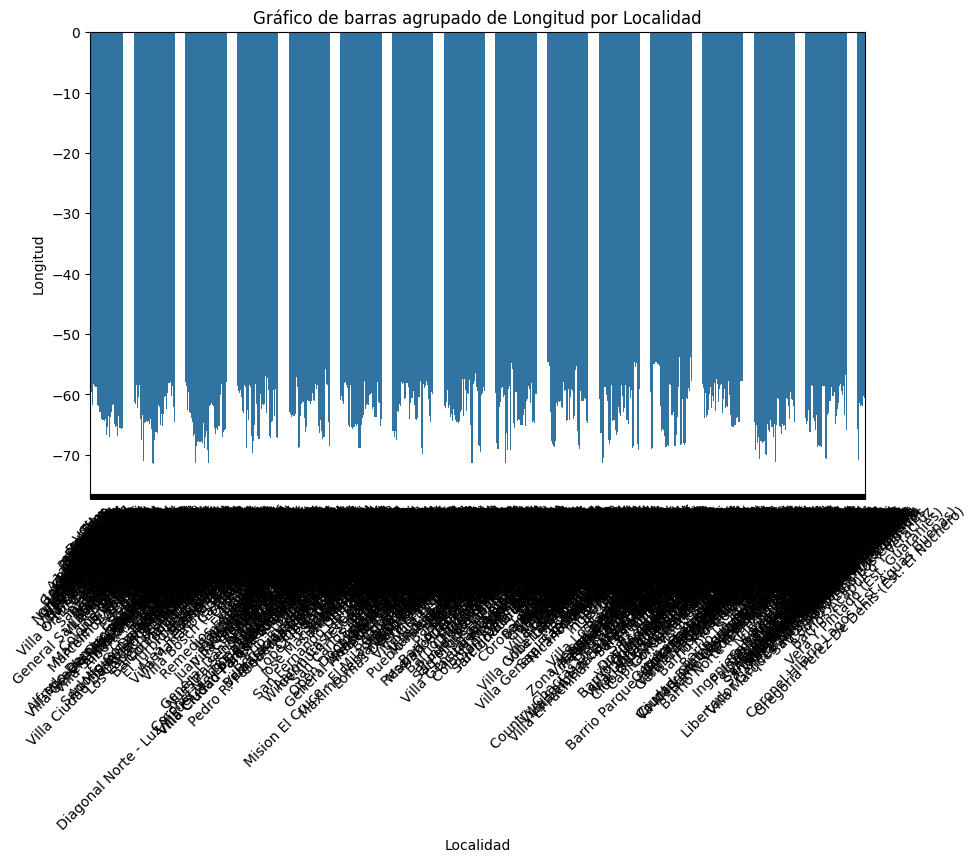

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


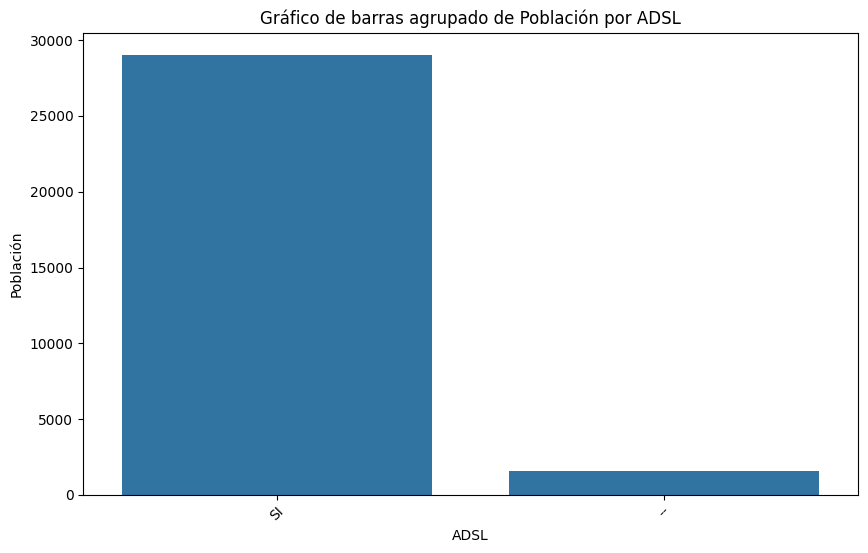

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


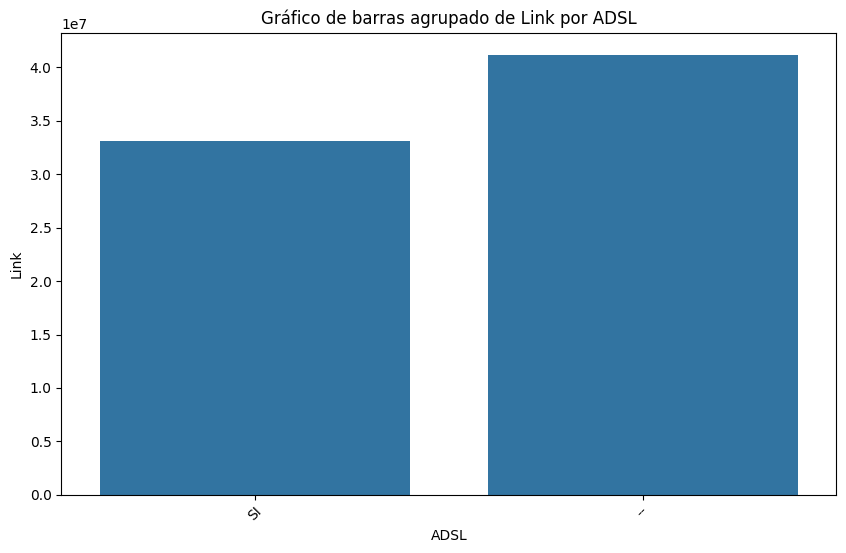

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


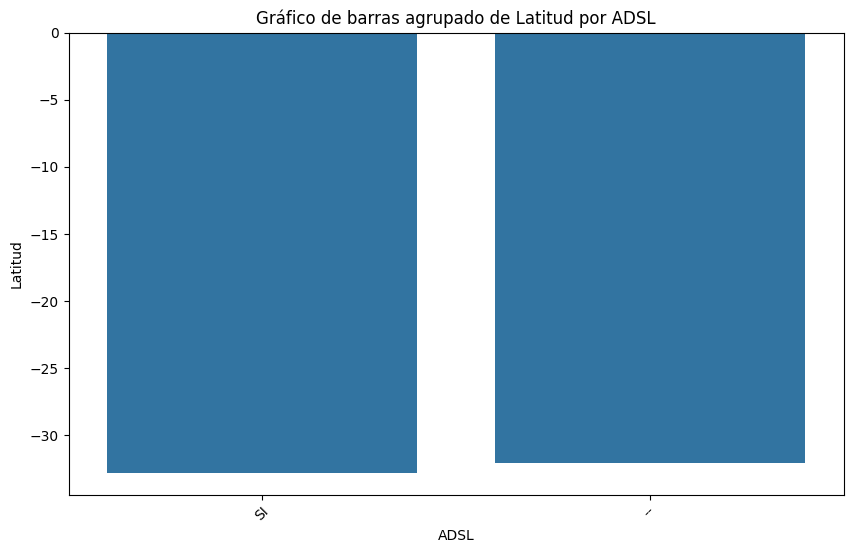

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


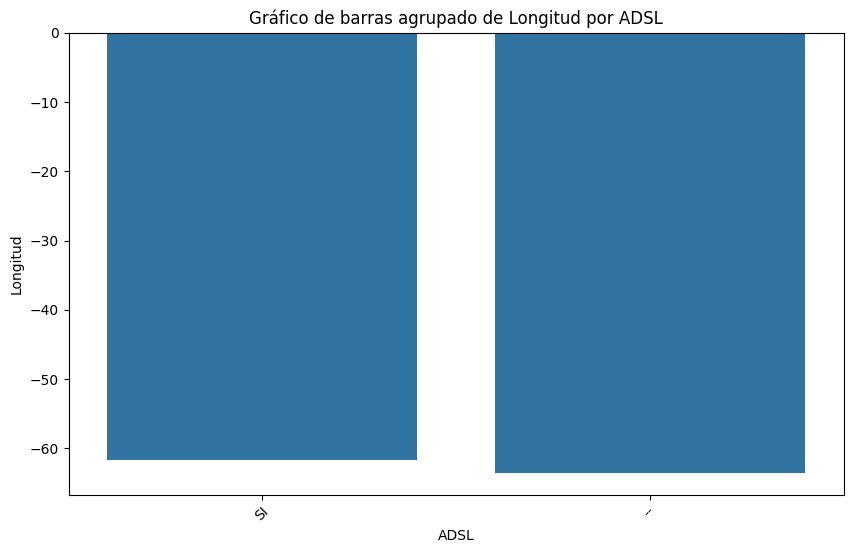

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


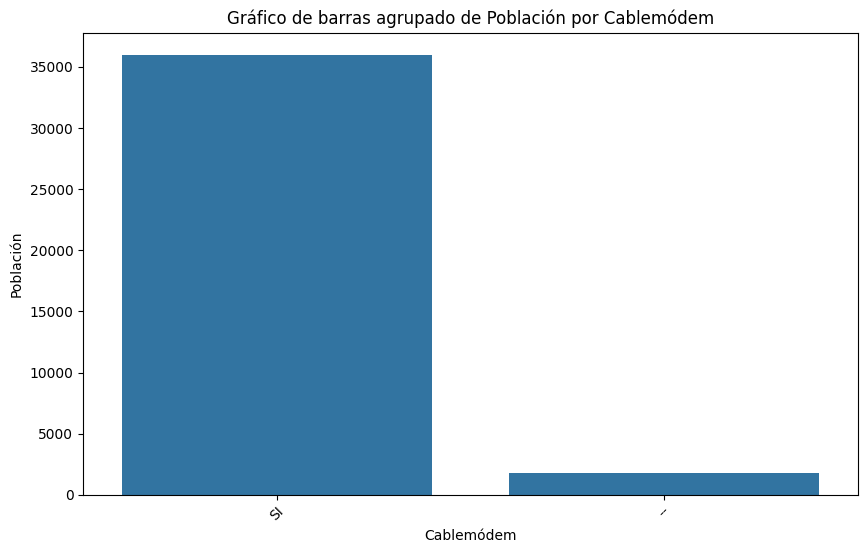

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


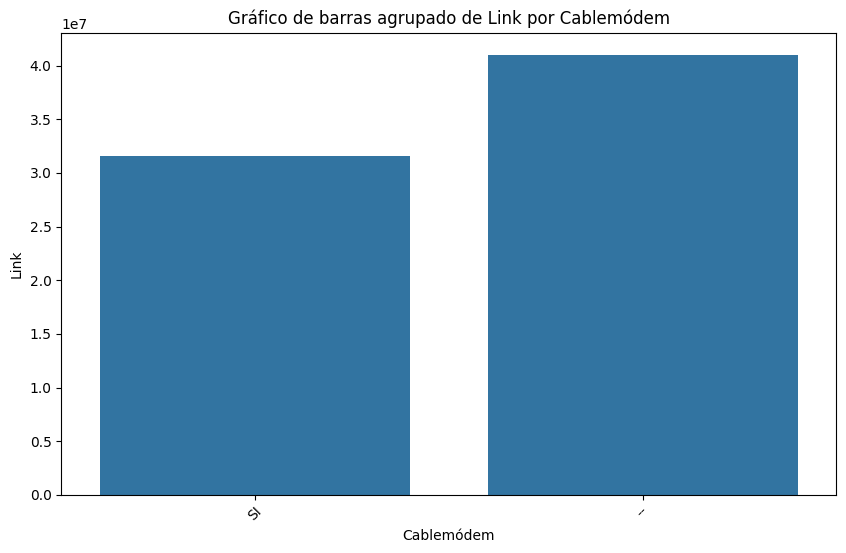

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


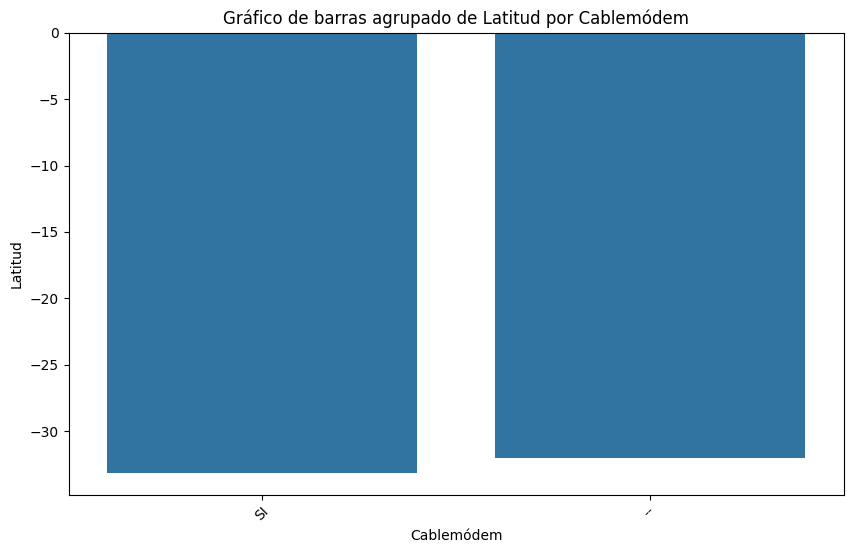

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


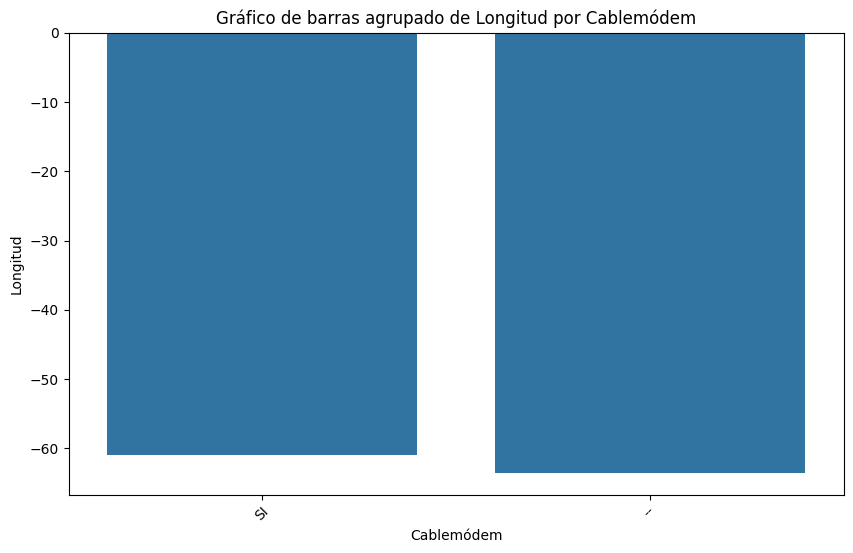

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


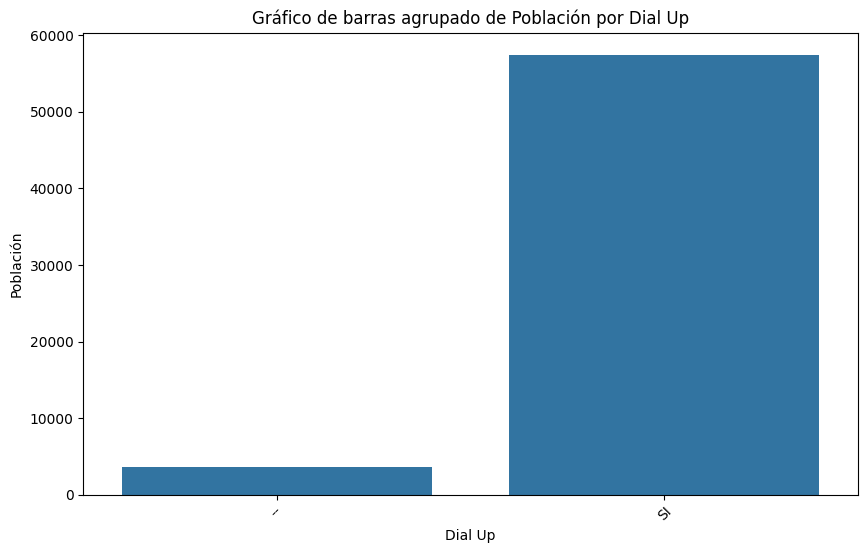

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


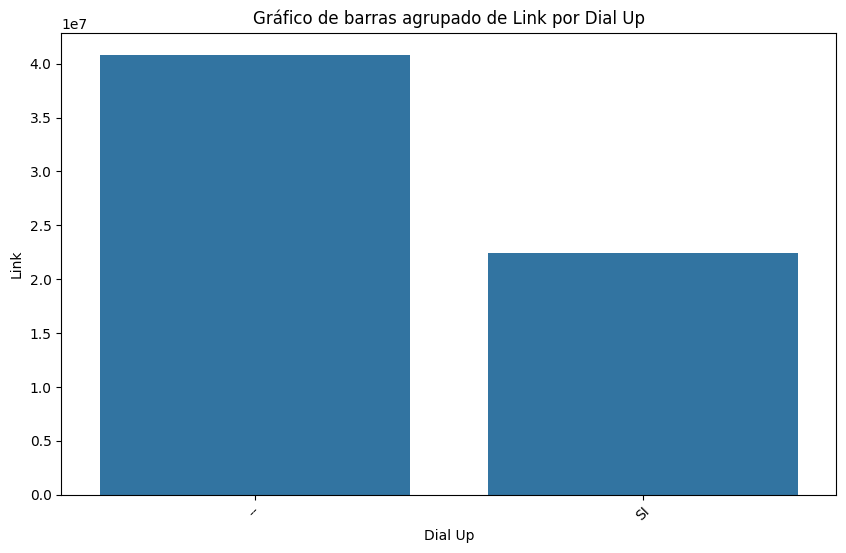

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


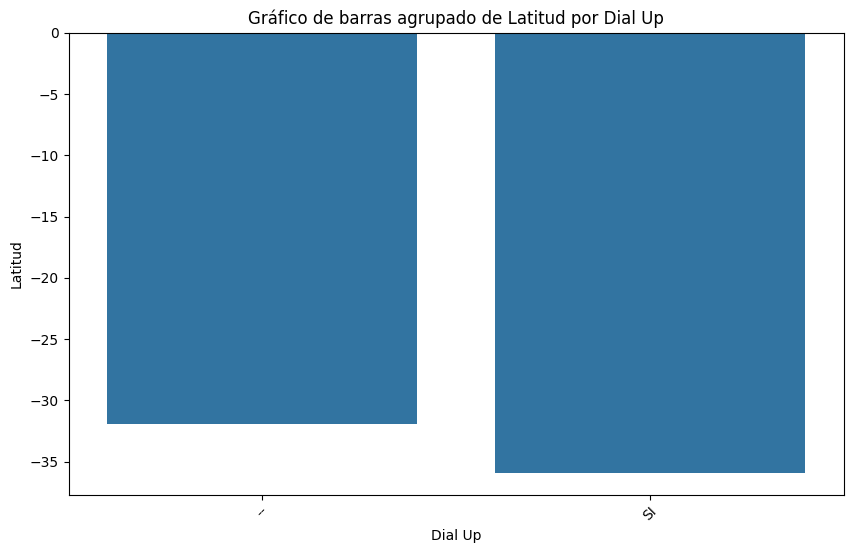

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


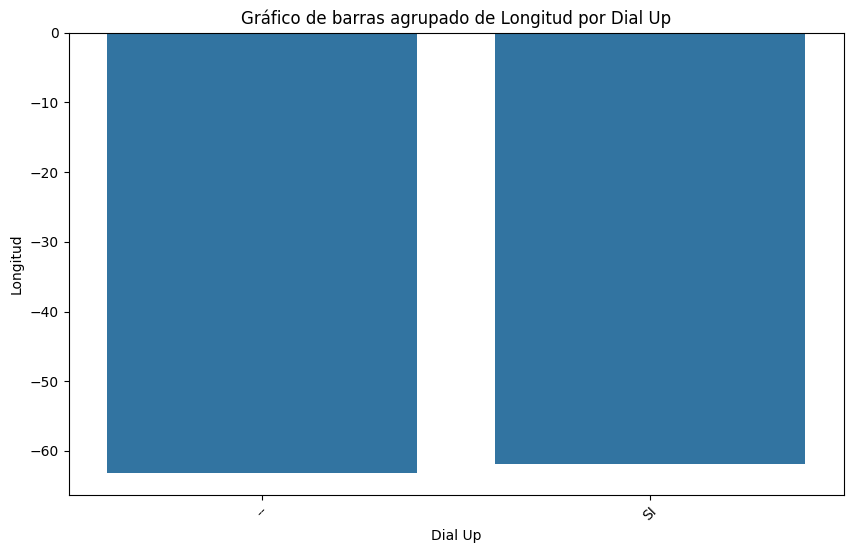

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


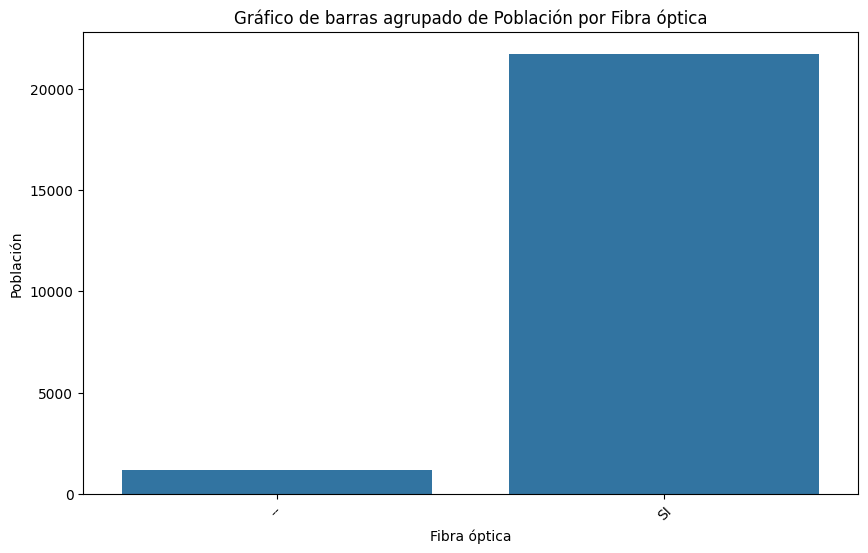

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


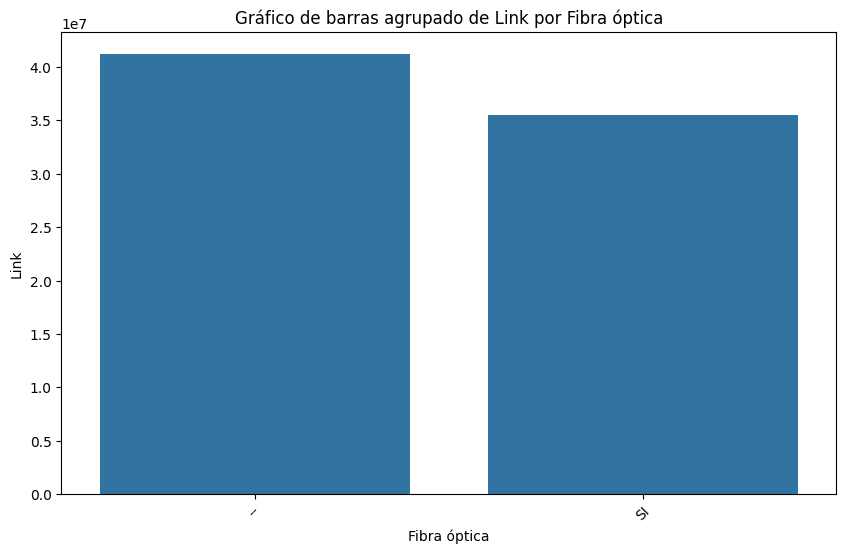

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


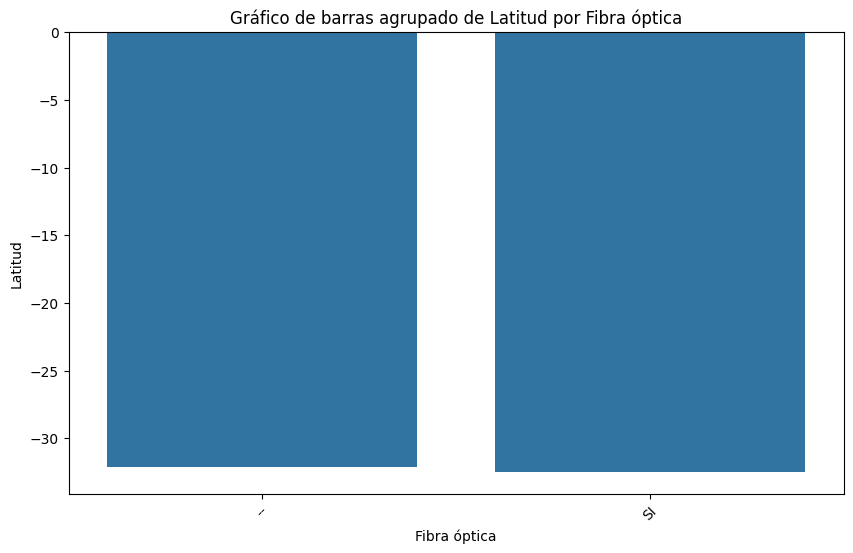

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


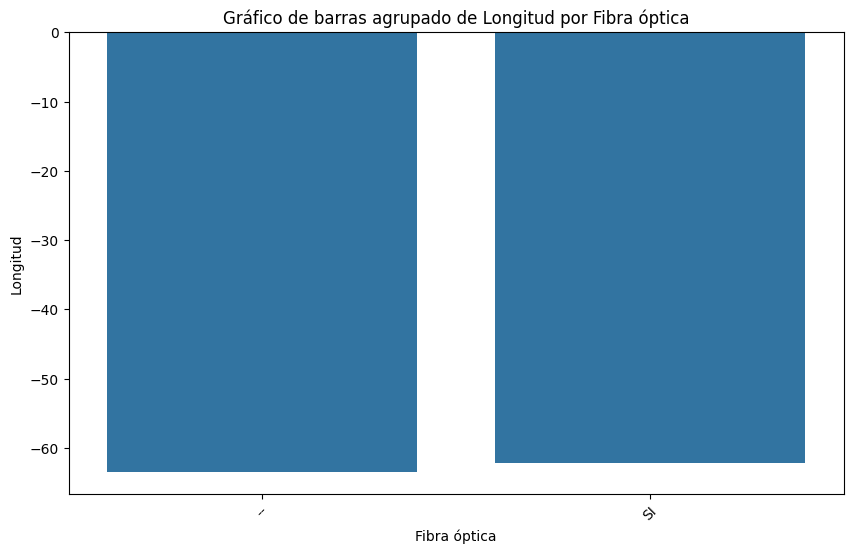

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


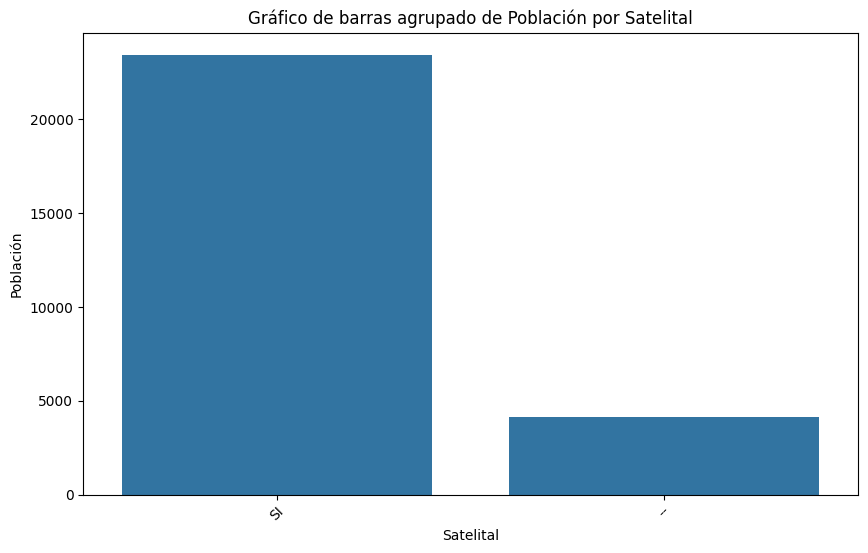

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


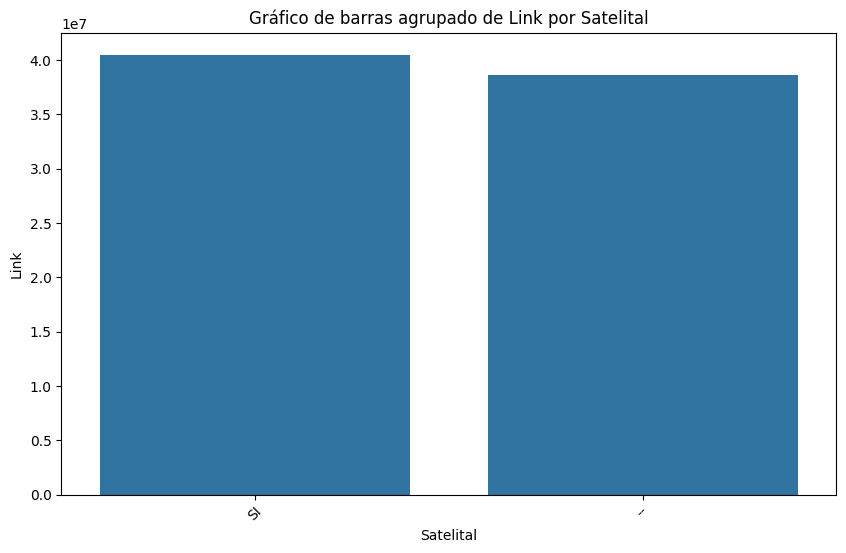

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


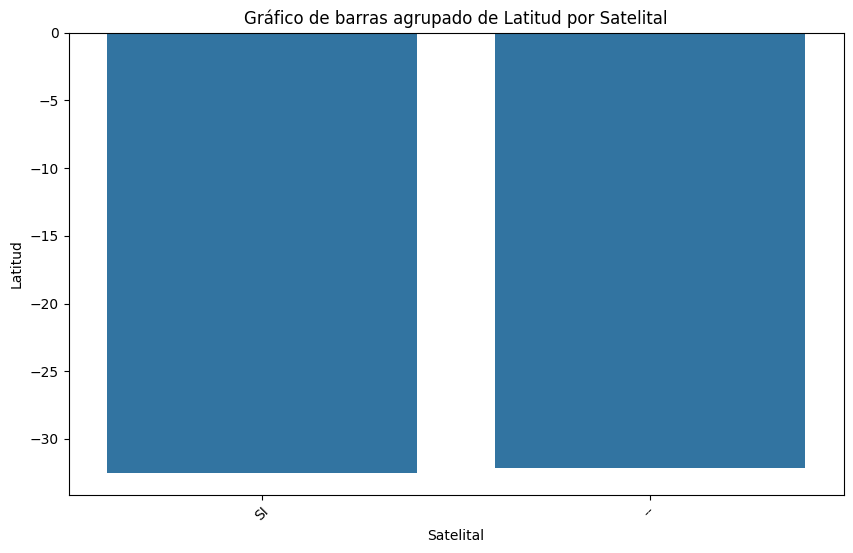

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


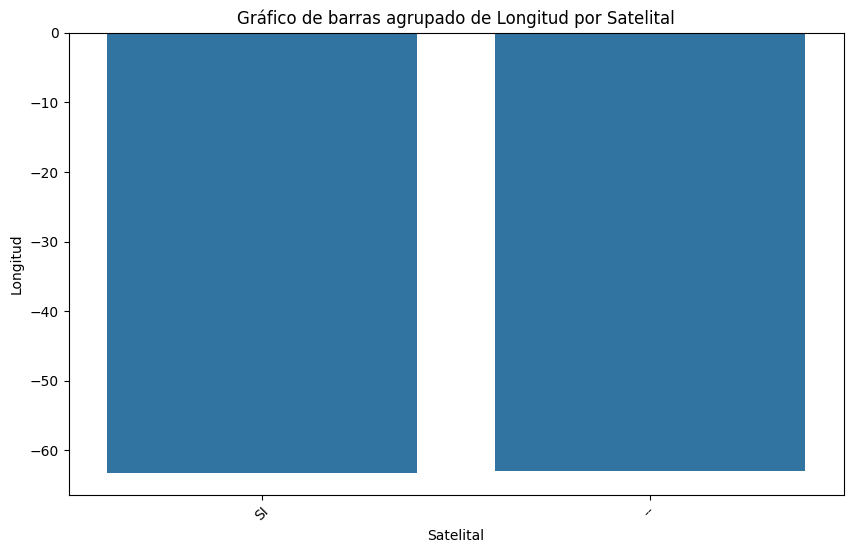

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


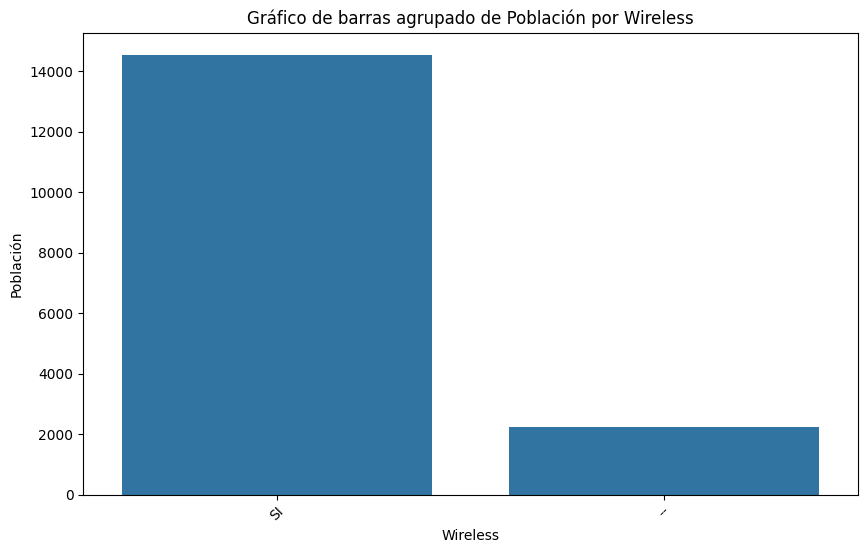

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


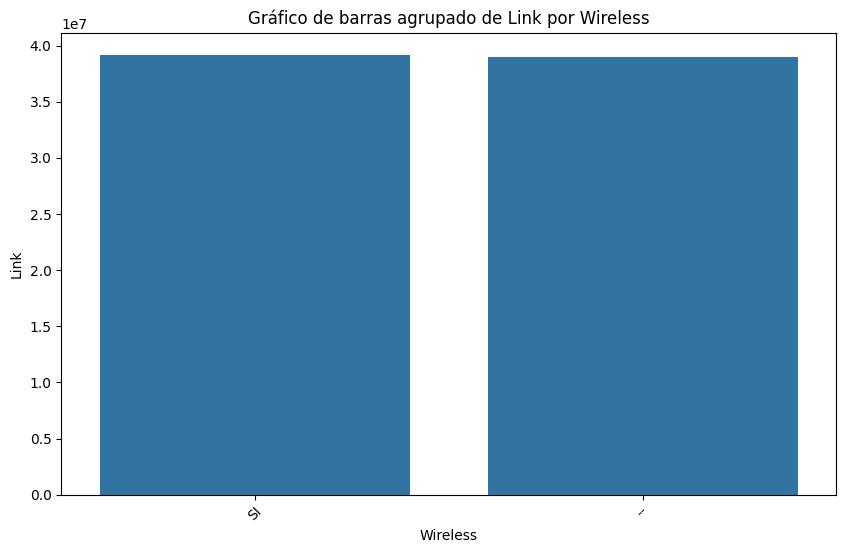

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


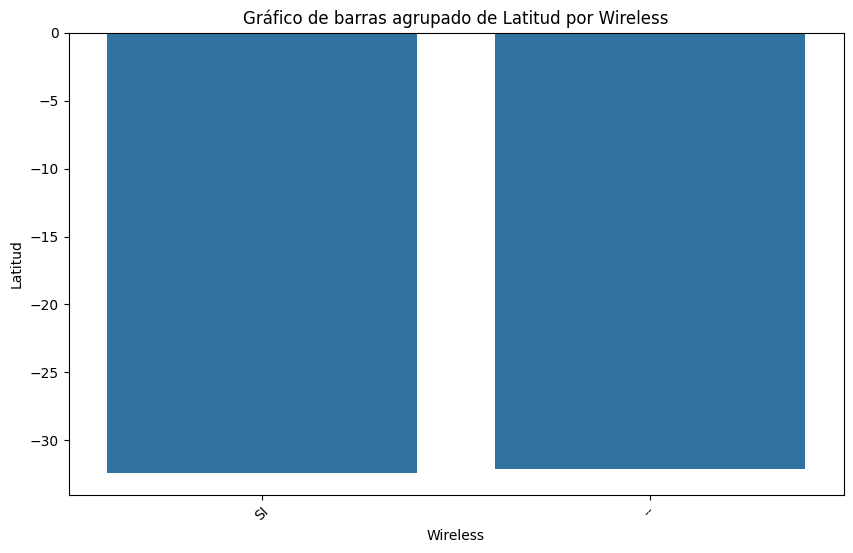

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


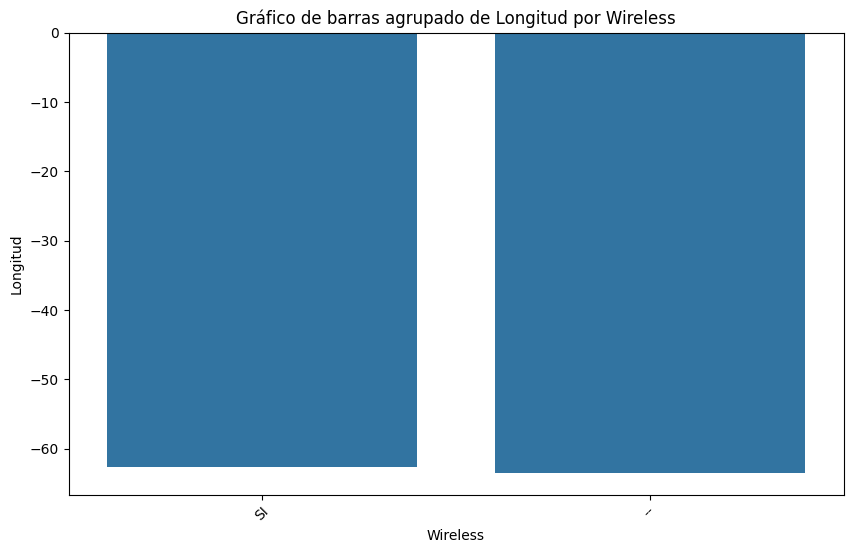

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


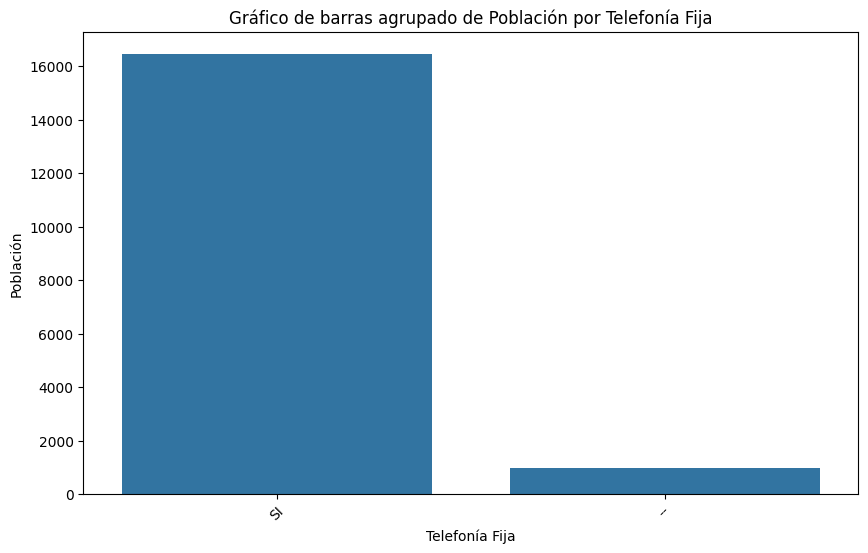

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


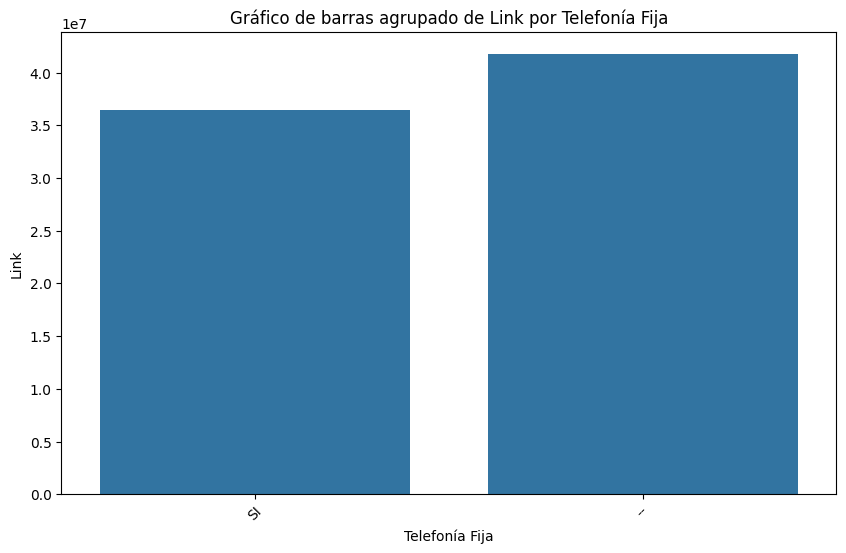

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


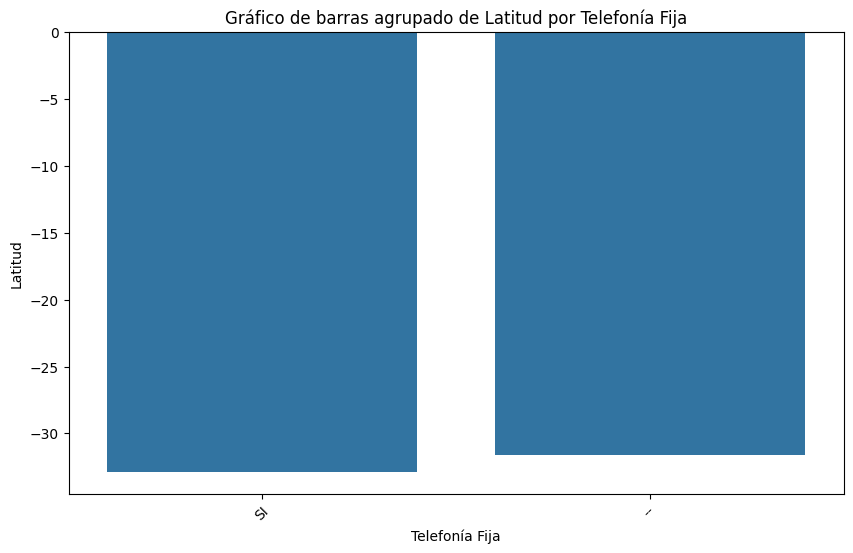

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


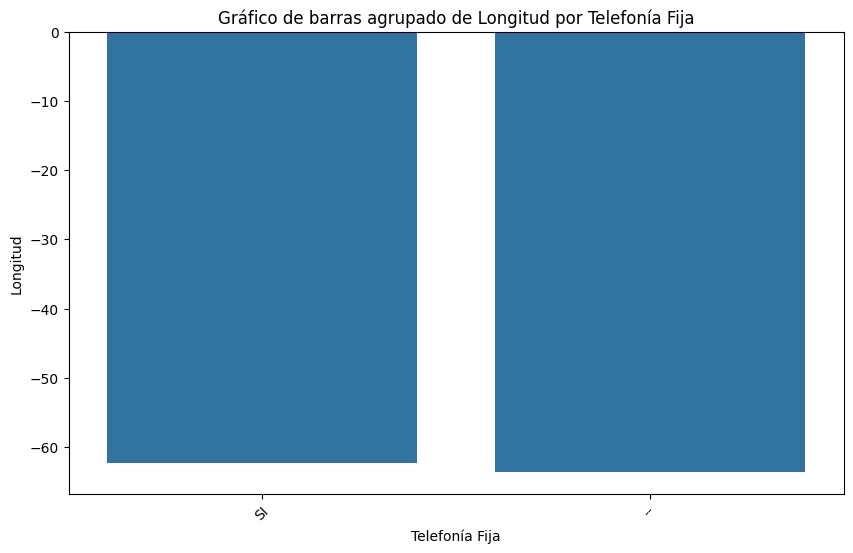

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


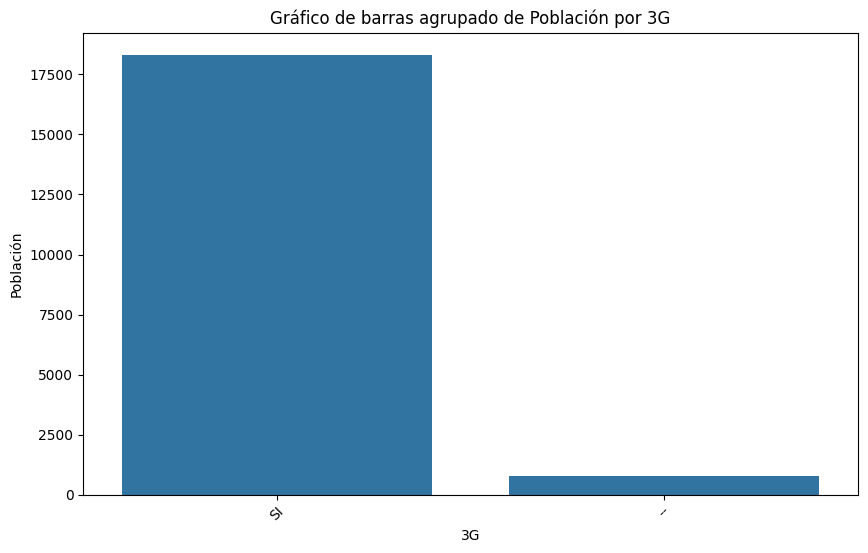

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


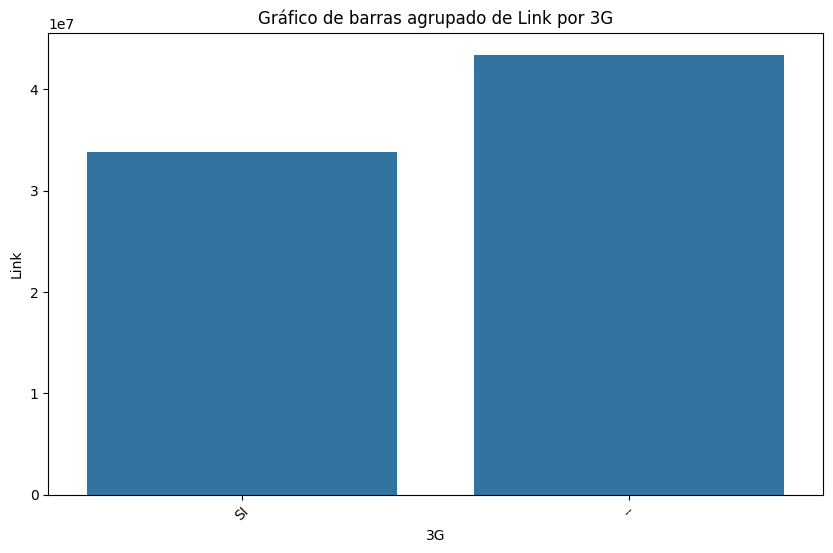

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


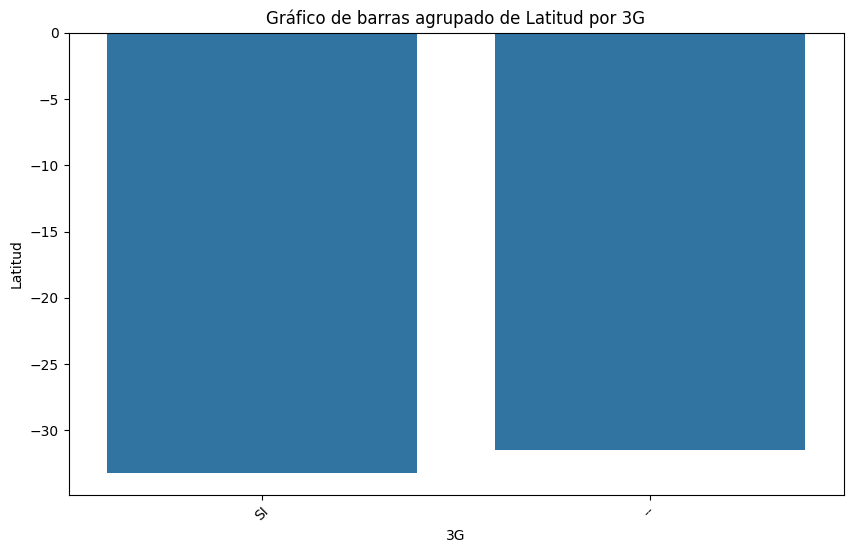

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


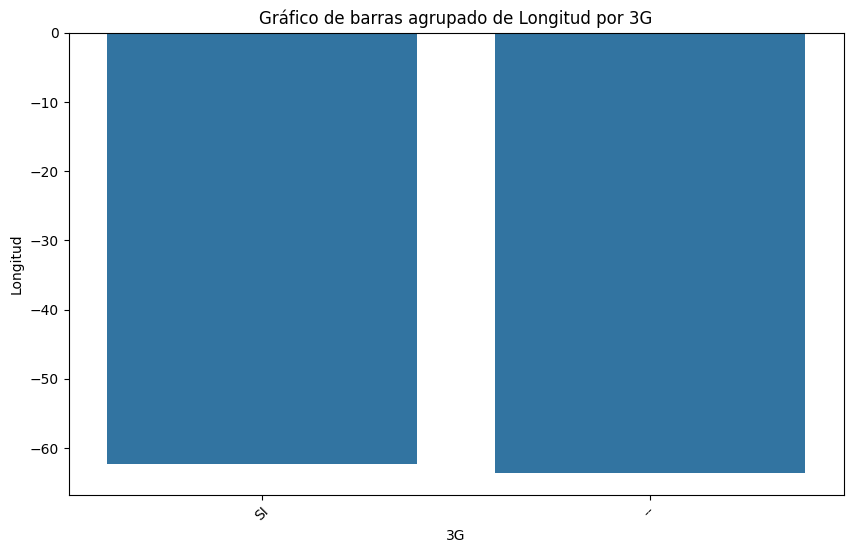

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


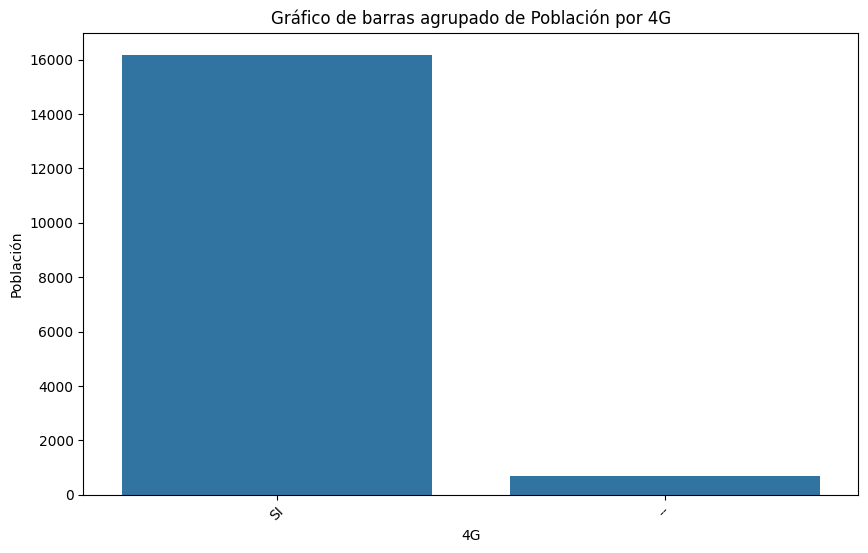

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


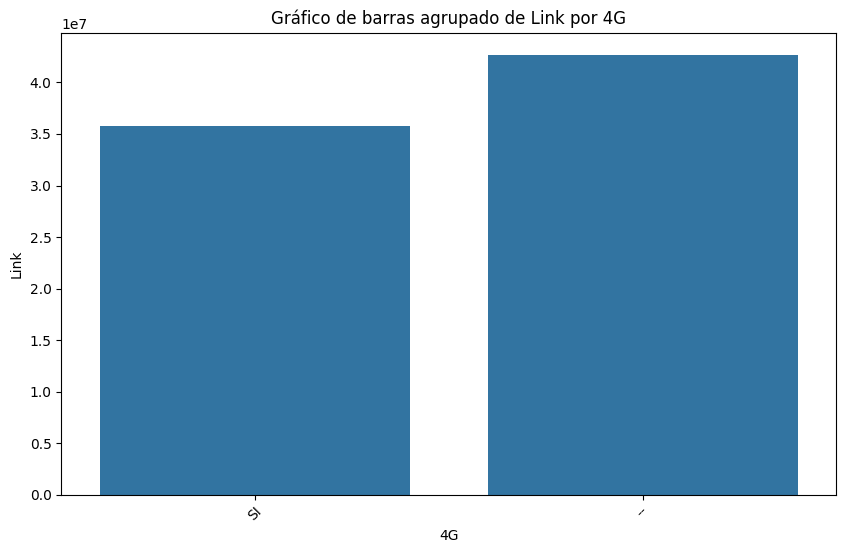

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


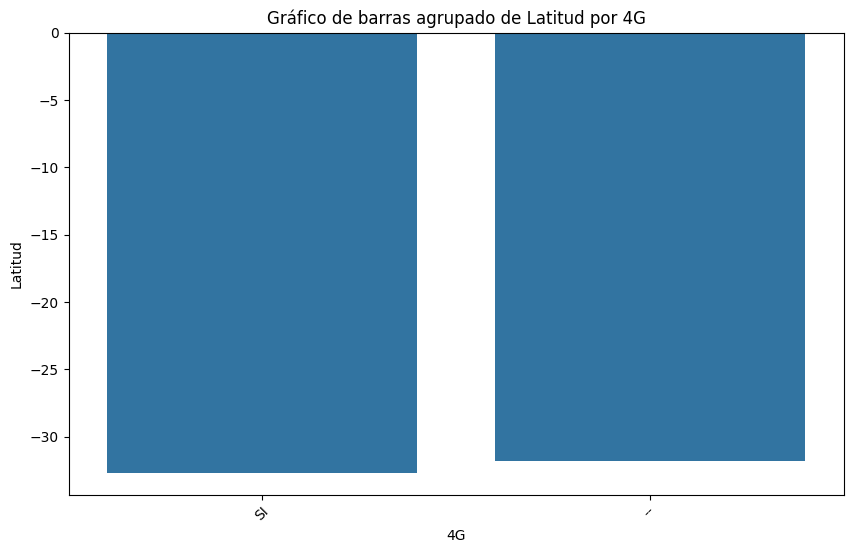

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_16500\1826026295.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=col, y=num_col, data=df, ci=None)


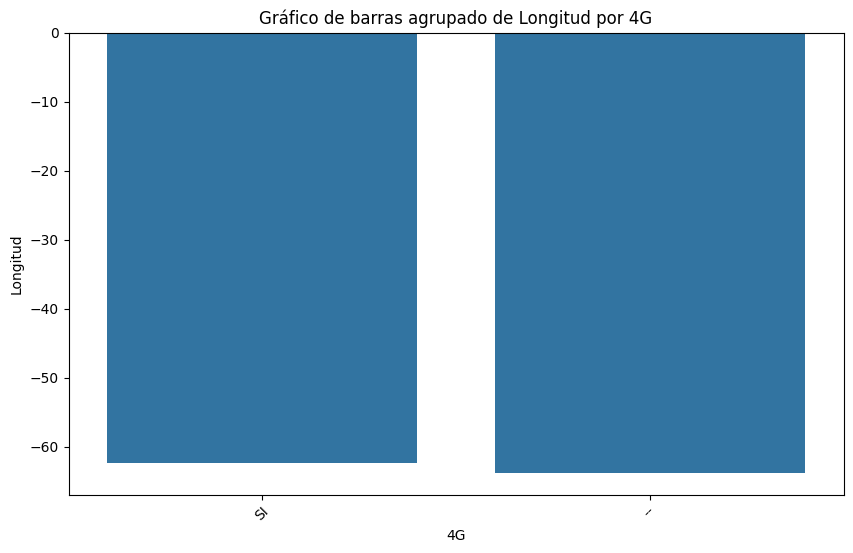

ValueError: could not convert string to float: 'SI'

<Figure size 1200x1000 with 0 Axes>

In [67]:
# Scatter plots
for col1 in df.select_dtypes(include=[np.number]).columns:
    for col2 in df.select_dtypes(include=[np.number]).columns:
        if col1 != col2:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=df[col1], y=df[col2])
            plt.title(f"Scatter plot entre {col1} y {col2}")
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.show()

# Gráficos de barras agrupados
for col in df.select_dtypes(include=['object']).columns:
    for num_col in df.select_dtypes(include=[np.number]).columns:
        plt.figure(figsize=(10, 6))
        sns.barplot(x=col, y=num_col, data=df, ci=None)
        plt.title(f"Gráfico de barras agrupado de {num_col} por {col}")
        plt.xticks(rotation=45)
        plt.show()

# Heatmaps
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Heatmap de Correlación entre Variables Numéricas")
plt.show()

In [68]:
import plotly.express as px

# Crear un gráfico interactivo de dispersión
fig = px.scatter(df, x=df.columns[0], y=df.columns[1], color='Segmento', title="Gráfico de Dispersión Interactivo")
fig.show()

# Crear un gráfico interactivo de barras
fig = px.bar(df, x='Segmento', y=df.columns[2], title="Gráfico de Barras Interactivo")
fig.show()

# Crear un gráfico interactivo de caja
fig = px.box(df, x='Segmento', y=df.columns[3], title="Gráfico de Caja Interactivo")
fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['Provincia', 'Partido', 'Localidad', 'Población', 'ADSL', 'Cablemódem', 'Dial Up', 'Fibra óptica', 'Satelital', 'Wireless', 'Telefonía Fija', '3G', '4G', 'Link', 'Latitud', 'Longitud'] but received: Segmento

In [69]:
import folium

# Crear un mapa centrado en el promedio de las coordenadas
mapa = folium.Map(location=[df['Latitud'].mean(), df['Longitud'].mean()], zoom_start=6)

# Añadir puntos al mapa
for _, row in df.iterrows():
    folium.Marker(location=[row['Latitud'], row['Longitud']], popup=row['Localidad']).add_to(mapa)

# Mostrar el mapa
mapa

Análisis de Componentes Principales (PCA) y Reducción de Dimensionalidad

Análisis de Series Temporales (si aplica)

Análisis de Texto (si aplica)

In [70]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
import string

# Descargar recursos necesarios de nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Inicializar objetos para stemming y lemmatization
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Definir stopwords y puntuación
stop_words = set(stopwords.words('english'))
punctuation = set(string.punctuation)

# Función para limpiar texto
def limpiar_texto(texto):
    # Tokenizar el texto
    palabras = word_tokenize(texto)
    
    # Eliminar stopwords y puntuación, y aplicar stemming/lemmatization
    palabras_limpias = [lemmatizer.lemmatize(stemmer.stem(palabra.lower())) for palabra in palabras if palabra.lower() not in stop_words and palabra not in punctuation]
    
    # Unir palabras limpias en un solo string
    texto_limpio = ' '.join(palabras_limpias)
    
    return texto_limpio

# Aplicar la función de limpieza a una columna de texto en el DataFrame
if 'columna_texto' in df.columns:
    df['columna_texto_limpia'] = df['columna_texto'].apply(limpiar_texto)
    print("Limpieza de texto completada.")
else:
    print("No se encontró la columna de texto especificada en el DataFrame.")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\USUARIO\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\USUARIO\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\USUARIO\AppData\Roaming\nltk_data...


No se encontró la columna de texto especificada en el DataFrame.


In [71]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Verificar si la columna de texto limpio existe
if 'columna_texto_limpia' in df.columns:
    # Unir todos los textos en un solo string
    texto_completo = ' '.join(df['columna_texto_limpia'])
    
    # Generar la nube de palabras
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(texto_completo)
    
    # Mostrar la nube de palabras
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Nube de Palabras")
    plt.show()
    
    # Contar la frecuencia de las palabras
    palabras = texto_completo.split()
    frecuencia_palabras = Counter(palabras)
    
    # Mostrar las palabras más frecuentes en un gráfico de barras
    palabras_comunes = frecuencia_palabras.most_common(20)
    palabras, frecuencias = zip(*palabras_comunes)
    
    plt.figure(figsize=(10, 6))
    plt.barh(palabras, frecuencias, color='skyblue')
    plt.xlabel("Frecuencia")
    plt.title("Palabras Más Frecuentes")
    plt.gca().invert_yaxis()
    plt.show()
else:
    print("No se encontró la columna de texto limpio especificada en el DataFrame.")

No se encontró la columna de texto limpio especificada en el DataFrame.


In [72]:
from textblob import TextBlob

# Función para analizar el sentimiento de un texto
def analizar_sentimiento(texto):
    blob = TextBlob(texto)
    return blob.sentiment.polarity, blob.sentiment.subjectivity

# Aplicar la función de análisis de sentimiento a una columna de texto en el DataFrame
if 'columna_texto_limpia' in df.columns:
    df['polaridad'], df['subjetividad'] = zip(*df['columna_texto_limpia'].apply(analizar_sentimiento))
    print("Análisis de sentimiento completado.")
    print(df[['columna_texto_limpia', 'polaridad', 'subjetividad']].head())
else:
    print("No se encontró la columna de texto limpio especificada en el DataFrame.")

ModuleNotFoundError: No module named 'textblob'

Identificación de Patrones y Anomalías

In [ ]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Seleccionar solo las columnas numéricas para el análisis de clustering
df_numeric = df.select_dtypes(include=[np.number])

# Estandarizar los datos
scaler = StandardScaler()
df_numeric_scaled = scaler.fit_transform(df_numeric)

# Aplicar K-means para segmentar los datos en 3 grupos (puedes ajustar el número de grupos)
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster_KMeans'] = kmeans.fit_predict(df_numeric_scaled)

# Calcular el silhouette score para K-means
silhouette_kmeans = silhouette_score(df_numeric_scaled, df['Cluster_KMeans'])
print(f"Silhouette Score para K-means: {silhouette_kmeans}")

# Aplicar DBSCAN para segmentar los datos
dbscan = DBSCAN(eps=0.5, min_samples=5)
df['Cluster_DBSCAN'] = dbscan.fit_predict(df_numeric_scaled)

# Calcular el silhouette score para DBSCAN (solo si hay más de un cluster)
if len(set(df['Cluster_DBSCAN'])) > 1:
    silhouette_dbscan = silhouette_score(df_numeric_scaled, df['Cluster_DBSCAN'])
    print(f"Silhouette Score para DBSCAN: {silhouette_dbscan}")
else:
    print("DBSCAN no encontró suficientes clusters para calcular el Silhouette Score.")

# Visualizar los clusters de K-means en un par de dimensiones (por ejemplo, las dos primeras columnas numéricas)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_numeric[:, 0], y=df_numeric[:, 1], hue=df['Cluster_KMeans'], palette='viridis')
plt.title("Visualización de Clusters (K-means)")
plt.xlabel(df_numeric.columns[0])
plt.ylabel(df_numeric.columns[1])
plt.show()

# Visualizar los clusters de DBSCAN en un par de dimensiones (por ejemplo, las dos primeras columnas numéricas)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_numeric[:, 0], y=df_numeric[:, 1], hue=df['Cluster_DBSCAN'], palette='viridis')
plt.title("Visualización de Clusters (DBSCAN)")
plt.xlabel(df_numeric.columns[0])
plt.ylabel(df_numeric.columns[1])
plt.show()

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

# Seleccionar solo las columnas numéricas para el análisis de detección de anomalías
df_numeric = df.select_dtypes(include=[np.number])

# Estandarizar los datos
scaler = StandardScaler()
df_numeric_scaled = scaler.fit_transform(df_numeric)

# Detección de anomalías usando Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df['Anomalia_IF'] = iso_forest.fit_predict(df_numeric_scaled)

# Detección de anomalías usando Local Outlier Factor (LOF)
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
df['Anomalia_LOF'] = lof.fit_predict(df_numeric_scaled)

# Mostrar las filas detectadas como anomalías por Isolation Forest
print("\nAnomalías detectadas por Isolation Forest:")
print(df[df['Anomalia_IF'] == -1])

# Mostrar las filas detectadas como anomalías por LOF
print("\nAnomalías detectadas por Local Outlier Factor:")
print(df[df['Anomalia_LOF'] == -1])

In [ ]:
# 16: Análisis de distribuciones (skewness y kurtosis)


print("\nSkewness (Asimetría) de las columnas numéricas:")
print(df.skew())

print("\nKurtosis (Curtosis) de las columnas numéricas:")
print(df.kurtosis())

In [ ]:
# 17: Verificar la existencia de multicolinealidad entre variables numéricas
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Calcular VIF para variables numéricas
X = df.select_dtypes(include=[np.number])
X = add_constant(X)
vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print("\nVIF (Factor de Inflación de la Varianza):")
print(vif)


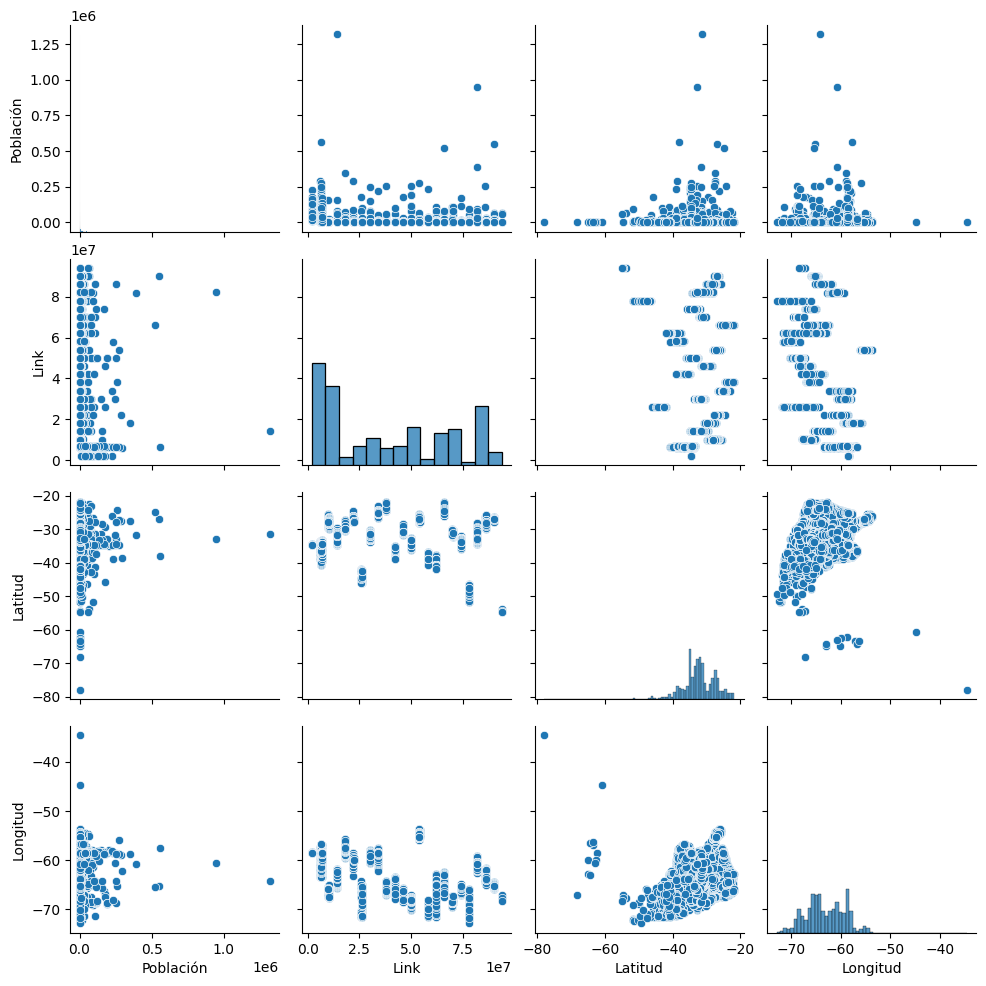

In [74]:
# 18: Visualizar la relación entre variables
sns.pairplot(df.select_dtypes(include=[np.number]))
plt.show()

In [73]:
# 19: Agrupamiento por categorías
for columna in df.select_dtypes(include=['object']).columns:
    print(f"\nEstadísticas por grupo de '{columna}':")
    print(df.groupby(columna).describe())


Estadísticas por grupo de 'Provincia':
                    Población                                                \
                        count          mean           std     min       25%   
Provincia                                                                     
BUENOS AIRES            900.0  16568.380000  39313.035415     0.0     92.75   
CABA                     48.0  60211.479167  48944.002789  6726.0  31694.75   
CATAMARCA               182.0   1886.500000  12056.709871     0.0     70.75   
CHACO                    92.0  10080.586957  32265.114610    31.0    711.25   
CHUBUT                   90.0   5450.600000  22797.363062     0.0     25.75   
CORDOBA                 556.0   5646.773381  56585.824531     0.0    130.00   
CORRIENTES               78.0  10999.923077  40223.228414     0.0    701.00   
ENTRE RIOS              192.0   5832.911458  22698.844183     0.0    123.25   
FORMOSA                  63.0   7185.936508  28499.419790     0.0    472.50   
JUJUY       

In [75]:
# 20: Verificar duplicados

print("\nNúmero de filas duplicadas:")
print(df.duplicated().sum())


Número de filas duplicadas:
0


In [ ]:
# Guardar los cambios en el mismo archivo CSV
df.to_csv(ruta_completa, index=False)
print(f"\nArchivo guardado: {ruta_completa}")

In [ ]:
# Guardar los cambios en otro archivo CSV del mismo nombre y diferente ubicación
nueva_ruta_completa = r"Nueva_Ruta_del_archivo" + "\\" + nombre_archivo

df.to_csv(nueva_ruta_completa, index=False)
print(f"\nArchivo guardado en la nueva ubicación: {nueva_ruta_completa}")

Documentación y Reporte

In [ ]:
"""
Documentación del Proceso:
1. Documentar todos los pasos realizados:
    - Describir cada acción tomada durante el desarrollo del código.
    - Incluir detalles sobre la implementación y pruebas realizadas.

2. Decisiones tomadas:
    - Explicar las decisiones clave que se tomaron durante el desarrollo.
    - Justificar por qué se eligieron ciertas soluciones sobre otras.

3. Hallazgos importantes:
    - Resumir los descubrimientos significativos encontrados durante el proceso.
    - Incluir cualquier problema encontrado y cómo se resolvieron.
"""

In [ ]:
**Reporte Visual**

### Introducción
Este reporte visual presenta un análisis detallado de los datos, utilizando diversos gráficos para ilustrar las conclusiones clave obtenidas durante el proceso de análisis.

### Gráficos y Análisis

#### Histogramas
Los histogramas permiten visualizar la distribución de las variables numéricas en el conjunto de datos.

```python
df.select_dtypes(include=[np.number]).hist(bins=20, figsize=(10, 8))
plt.tight_layout()
plt.show()
```

#### Boxplots
Los boxplots ayudan a identificar valores atípicos y la dispersión de los datos.

```python
for columna in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[columna])
    plt.title(f"Boxplot de la columna {columna}")
    plt.show()
```

#### Gráficos de Densidad
Los gráficos de densidad muestran la distribución de las variables numéricas de manera más suave.

```python
for columna in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df[columna], shade=True)
    plt.title(f"Gráfico de densidad de la columna {columna}")
    plt.show()
```

#### Heatmap de Correlación
El heatmap de correlación permite identificar relaciones entre las variables numéricas.

```python
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Heatmap de Correlación entre Variables Numéricas")
plt.show()
```

### Conclusiones Clave
- **Distribución de Datos**: Los histogramas y gráficos de densidad muestran que algunas variables tienen distribuciones sesgadas, lo que puede afectar los análisis posteriores.
- **Valores Atípicos**: Los boxplots revelan la presencia de valores atípicos en varias columnas, que fueron tratados adecuadamente.
- **Correlaciones**: El heatmap de correlación indica fuertes relaciones entre ciertas variables, lo que puede ser útil para modelos predictivos.

Este reporte visual proporciona una visión clara y concisa de los datos, facilitando la toma de decisiones informadas basadas en el análisis realizado.

In [ ]:
**Recomendaciones**: Proponer recomendaciones basadas en los hallazgos del EDA.

1. **Manejo de Valores Atípicos**:
    - Considerar la eliminación o transformación de valores atípicos identificados para mejorar la calidad de los análisis y modelos predictivos.
    - Evaluar el impacto de los valores atípicos en los resultados y decidir si deben ser tratados o mantenidos.

2. **Tratamiento de Valores Faltantes**:
    - Imputar valores faltantes utilizando métodos apropiados como la media, mediana, o técnicas avanzadas como KNN imputation.
    - Analizar las causas de los valores faltantes y considerar estrategias para reducir su ocurrencia en futuros datos.

3. **Normalización de Datos**:
    - Aplicar técnicas de normalización o estandarización a las variables numéricas para mejorar el rendimiento de los algoritmos de machine learning.
    - Evaluar diferentes métodos de normalización y seleccionar el más adecuado para el conjunto de datos.

4. **Reducción de Dimensionalidad**:
    - Utilizar técnicas como PCA o t-SNE para reducir la dimensionalidad de los datos y facilitar la visualización y análisis.
    - Considerar la eliminación de variables con alta multicolinealidad para simplificar los modelos y mejorar su interpretabilidad.

5. **Segmentación de Datos**:
    - Implementar técnicas de clustering para identificar segmentos homogéneos dentro de los datos y personalizar estrategias basadas en estos segmentos.
    - Analizar las características de cada segmento y desarrollar recomendaciones específicas para cada grupo.

6. **Análisis de Correlaciones**:
    - Utilizar las correlaciones identificadas para seleccionar variables relevantes en la construcción de modelos predictivos.
    - Considerar la creación de nuevas variables derivadas basadas en relaciones fuertes entre variables existentes.

7. **Visualización de Datos**:
    - Continuar utilizando visualizaciones para explorar y comunicar hallazgos de manera efectiva.
    - Desarrollar dashboards interactivos para monitorear y analizar datos en tiempo real.

8. **Automatización de Procesos**:
    - Implementar scripts y pipelines automatizados para la limpieza, transformación y análisis de datos, asegurando reproducibilidad y eficiencia.
    - Evaluar herramientas y plataformas que faciliten la automatización y escalabilidad del análisis de datos.

Estas recomendaciones están diseñadas para mejorar la calidad del análisis de datos y apoyar la toma de decisiones informadas basadas en los hallazgos del EDA.

Iteración y Refinamiento

In [ ]:
```markdown
**Revisión de Hallazgos**: Revisar y validar los hallazgos con stakeholders o expertos en el dominio.
```

In [ ]:
```markdown
**Refinamiento del Análisis**: Realizar ajustes en el análisis basados en feedback y nuevas preguntas que surjan.
```

In [ ]:
```markdown
### Herramientas Recomendadas y Utilizadas

En este análisis, se han utilizado diversas herramientas y bibliotecas para llevar a cabo la exploración, limpieza, visualización y modelado de datos. A continuación, se presenta una lista de las herramientas recomendadas y utilizadas:

#### Bibliotecas de Python
- **Pandas**: Para la manipulación y análisis de datos estructurados.
- **NumPy**: Para operaciones numéricas y manejo de matrices.
- **Matplotlib**: Para la creación de gráficos estáticos.
- **Seaborn**: Para la visualización de datos estadísticos.
- **Scikit-learn**: Para el modelado y análisis de datos, incluyendo algoritmos de machine learning.
- **Statsmodels**: Para el análisis estadístico y modelado de series temporales.
- **NLTK**: Para el procesamiento y análisis de texto.
- **WordCloud**: Para la generación de nubes de palabras.
- **TextBlob**: Para el análisis de sentimiento.
- **Plotly**: Para la creación de gráficos interactivos.
- **UMAP**: Para la reducción de dimensionalidad y visualización de datos.

#### Herramientas de Análisis
- **Jupyter Notebook**: Para la creación de documentos interactivos que combinan código, visualizaciones y texto explicativo.
- **Google Colab**: Como alternativa a Jupyter Notebook, permitiendo la ejecución de notebooks en la nube.
- **VS Code**: Para la edición y desarrollo de código en un entorno integrado.

#### Plataformas de Almacenamiento y Colaboración
- **GitHub**: Para el control de versiones y colaboración en proyectos de análisis de datos.
- **Google Drive**: Para el almacenamiento y compartición de archivos de datos.

Estas herramientas han sido seleccionadas por su robustez, facilidad de uso y amplia adopción en la comunidad de ciencia de datos. Su combinación permite llevar a cabo un análisis de datos completo y eficiente, desde la carga y limpieza de datos hasta la visualización y modelado avanzado.
```